# Import packages

In [1]:
import pandas as pd
import pandas_datareader.data as web
import numpy as np
import matplotlib.pyplot as plt
import datetime
import yfinance as yf
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from scipy.optimize import minimize
import cvxpy as cp
import pytz
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import STL
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit
import statsmodels.tsa.api as smt
from copy import deepcopy
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import arma_order_select_ic
import warnings
warnings.filterwarnings("ignore")
import statsmodels.tools.eval_measures
import scipy 
from scipy import stats 
from statsmodels.tsa.api import VAR
from statsmodels.tsa.api import VARMAX

# Define functions

In [2]:
def test_stationarity(data):
    rolling_mean = data.rolling(window=7).mean()
    rolling_std = data.rolling(window=7).std()
    
    fig, ax = plt.subplots(figsize=(20, 4))
    ax.plot(data, label='Original')
    ax.plot(rolling_mean, label='Rolling Mean')
    ax.plot(rolling_std, label='Rolling Std')
    
    ax.legend()
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')
    plt.title('Rolling Mean and Standard Deviation - {}'.format(data.name))
    plt.tight_layout()
    plt.show()
    
    result = adfuller(data)
    print('Augumented Dickey-Fuller Test')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:', result[4])
    
def causality_vs_all(data, model):
    columns = data.columns.tolist()

    for i in range(len(columns)):
        vs = deepcopy(columns)
        tv = vs.pop(i)
        result = model.test_causality(tv, vs, kind='f')
        print(result.summary())
        
def causality_vs_each(data, model):
    columns = data.columns.tolist()

    for i in range(len(columns)):
        vs = deepcopy(columns)
        tv = vs.pop(i)
        for v in vs:
            result = model.test_causality(tv, v, kind='f')
            print(result.summary())

# Stock selection

In [3]:
sc = ["AMD", "ADI", "AMAT", "AVGO", "FSLR", "INTC", "MCHP", "MU", "MPWR", "NVDA", "NXPI", "ON", "QCOM", "SWKS", "TXN"]
hd = ["AAPL", "HPQ", "NTAP", "STX", "WDC"]
sw = ["ADBE", "ANSS", "ADSK", "CDNS", "FICO", "GEN", "INTU", "ORCL", "PANW", "PTC", "CRM", "SNPS", "TYL"]
ib =  ["SCHW", "GS", "MS", "RJF"]
fx = ["CBOE", "CME", "FDS", "ICE", "MKTX", "MCO","MSCI", "NDAQ", "SPGI"]
tp = ["FIS", "FI", "FLT", "GPN", "JKHY", "MA", "V"]
db = ["BAC", "C", "CMA", "JPM", "USB", "WFC"]
symbols = [sc, hd, sw, ib, fx, tp, db]


# Download monthly data

In [7]:
stock_symbols = sc
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

sc_mo = joined_df.drop(0)
sc_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

,ADI,AMAT,AMD,AVGO,FSLR,INTC,MCHP,MPWR,MU,NVDA,NXPI,ON,QCOM,SWKS,TXN
1,0.054678,0.027648,0.061271,0.167381,-0.090574,0.094510,0.041369,0.037031,0.030341,0.031968,0.077614,0.150315,0.013828,0.071472,0.020942
2,-0.046758,-0.049866,-0.120694,0.037420,-0.077210,-0.056253,0.002455,-0.058518,0.057618,-0.020177,0.051348,0.014458,-0.000404,0.057489,-0.034993
3,0.051480,0.119763,0.078472,0.121518,0.120722,0.008925,0.015265,0.091996,0.048708,0.157602,0.150984,0.110848,0.014314,0.158910,0.065642
4,0.051950,0.079497,0.077759,0.042985,0.201212,0.051024,0.055210,0.078582,-0.022154,-0.021399,0.044861,0.006403,0.046327,0.056468,0.047773
5,-0.035434,-0.068923,0.019754,-0.009962,-0.033511,0.033527,-0.004617,-0.044030,0.098916,0.030789,0.013679,0.001063,0.002756,0.089917,-0.036933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,0.091984,0.083528,-0.037054,0.071022,-0.065511,0.065759,0.179198,0.097773,-0.077565,0.111626,0.133503,0.123403,0.055370,0.073286,0.042372
116,0.028718,0.047623,0.004292,0.040672,0.087152,0.067357,0.047413,0.036929,0.123279,0.099634,0.091004,0.130368,0.104629,0.032705,-0.000111
117,-0.093167,0.007689,-0.078907,0.026616,-0.092268,-0.017770,-0.137890,-0.070873,-0.018640,0.054674,-0.080566,-0.090163,-0.143252,-0.050479,-0.061634
118,-0.037497,-0.096192,-0.027814,-0.105386,-0.157319,0.015191,-0.042240,-0.120588,-0.027689,-0.126301,-0.028599,-0.057589,-0.023710,-0.091517,-0.055354


In [8]:
stock_symbols = hd
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

hd_mo = joined_df.drop(0)
hd_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,AAPL,HPQ,NTAP,STX,WDC
1,0.014684,0.022773,-0.002671,0.144480,0.111604
2,-0.113949,0.041055,0.028752,-0.060558,0.030334
3,0.049950,0.029894,-0.042912,-0.012756,0.009471
4,0.025724,0.079733,-0.090866,0.082108,0.054037
5,0.094761,0.026192,-0.035585,-0.065869,-0.038240
...,...,...,...,...,...
115,0.091525,0.055226,0.141039,0.029026,-0.020872
116,0.012704,0.075432,0.020854,0.036951,0.115173
117,-0.044658,-0.099859,-0.010360,0.108678,0.055748
118,-0.091510,-0.144993,-0.010748,-0.070821,0.013903


In [9]:
stock_symbols = sw
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

sw_mo = joined_df.drop(0)
sw_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,ADBE,ADSK,ANSS,CDNS,CRM,FICO,GEN,INTU,ORCL,PANW,PTC,SNPS,TYL
1,0.053158,0.106200,0.017702,0.056487,0.057809,0.062885,0.053764,0.027766,0.080805,0.140241,0.083959,0.102161,-0.004689
2,-0.011590,0.018313,-0.104724,0.007107,0.092357,-0.144624,-0.096540,-0.041057,-0.036194,0.033873,0.008161,-0.017656,0.031990
3,0.147977,0.023717,0.061605,0.082219,0.029945,-0.011657,0.003264,0.067221,0.061343,0.179655,0.096889,0.013456,-0.117285
4,-0.043022,-0.064945,-0.081021,0.013606,-0.088455,0.029542,-0.065562,-0.005389,0.044996,-0.036498,-0.104202,-0.050512,-0.113952
5,-0.063586,-0.023869,-0.009261,0.001286,-0.100139,0.033419,0.015404,-0.025803,-0.000733,-0.075994,-0.001413,-0.020782,-0.024558
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,0.157363,0.025843,0.020433,0.015513,-0.055785,0.026979,0.063770,0.089127,0.117007,0.180140,0.057117,-0.043921,0.047979
116,0.110588,0.035433,0.035193,-0.002177,0.063055,0.034924,0.047377,0.110455,-0.015742,-0.021961,0.024367,0.036951,-0.048811
117,0.023827,0.045868,-0.070320,0.027107,-0.015903,0.076500,0.040308,0.058906,0.030102,-0.027006,0.009284,0.015571,0.004528
118,-0.092543,-0.070123,-0.069201,-0.025868,-0.088120,-0.040680,-0.129501,-0.058663,-0.128052,-0.037096,-0.038017,0.000174,-0.031332


In [10]:
stock_symbols = ib
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

ib_mo = joined_df.drop(0)
ib_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,GS,MS,RJF,SCHW
1,0.051352,0.001915,0.079947,0.062819
2,-0.077020,-0.060804,-0.021744,-0.046447
3,0.014097,0.044446,0.036073,0.065872
4,-0.012373,0.011941,0.057969,0.032953
5,-0.024903,-0.007730,-0.115095,-0.028955
...,...,...,...,...
115,0.003378,0.043558,0.138486,0.078267
116,0.098338,0.069648,0.063000,0.153747
117,-0.082436,-0.063373,-0.051069,-0.111092
118,-0.004410,-0.041728,-0.040587,-0.070727


In [11]:
stock_symbols = fx
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

fx_mo = joined_df.drop(0)
fx_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,CBOE,CME,FDS,ICE,MCO,MKTX,MSCI,NDAQ,SPGI
1,-0.002789,-0.043520,-0.036848,0.053092,0.053511,-0.048138,-0.015208,0.012897,0.052275
2,0.010771,-0.010822,-0.026221,-0.071437,-0.050844,-0.064648,-0.023139,-0.038993,-0.028011
3,0.037911,-0.012653,-0.004548,0.000239,0.057575,-0.060784,0.022910,0.006271,0.046508
4,0.049817,0.002706,0.027017,-0.054160,0.007570,0.005699,-0.015912,-0.038502,-0.039348
5,-0.058948,-0.044115,-0.012225,0.035979,-0.010392,-0.095428,-0.059376,0.002209,-0.031554
...,...,...,...,...,...,...,...,...,...
115,0.041347,0.035934,0.042657,0.065128,0.095365,-0.038773,0.000264,-0.104658,0.089684
116,0.012028,0.077226,0.082350,0.018957,0.014362,0.029400,0.155200,0.017066,-0.016043
117,0.069346,0.018525,0.003144,0.027408,-0.046270,-0.111023,-0.008171,0.038657,-0.009295
118,0.042501,-0.012212,0.004223,-0.069938,-0.060884,-0.117536,-0.055289,-0.077014,-0.065001


In [12]:
stock_symbols = tp
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

tp_mo = joined_df.drop(0)
tp_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,FI,FIS,FLT,GPN,JKHY,MA,V
1,0.072052,0.057509,-0.038590,0.030631,0.045589,0.093598,0.092286
2,-0.052140,-0.052748,-0.097172,0.016784,-0.059675,-0.098883,-0.033100
3,0.035061,0.092437,0.200542,0.062181,0.041267,0.027930,0.047634
4,-0.023707,-0.039617,-0.121194,0.011327,-0.037848,-0.039632,-0.043839
5,0.069663,0.004019,-0.008463,-0.062076,-0.010819,-0.015514,-0.063347
...,...,...,...,...,...,...,...
115,0.117278,0.002379,0.102806,0.008460,0.093813,0.074621,0.073733
116,0.000475,0.108283,-0.008680,0.114979,0.001433,0.002489,0.001052
117,-0.038939,-0.077809,0.087718,0.138993,-0.066558,0.046959,0.032894
118,-0.071975,-0.010618,-0.062213,-0.093425,-0.036637,-0.041389,-0.064028


In [13]:
stock_symbols = db
# Define the date range for the past 10 years
end_date = pd.to_datetime('today')
start_date = end_date - pd.DateOffset(years=10)

# Create an empty DataFrame to store the data
allstock = pd.DataFrame()

# Loop through each stock symbol and fetch the data
for symbol in stock_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1mo')
    stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
    allstock = pd.concat([stock_data, allstock])
    
allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

lnreturn = allstock[["Log Returns", "Symbol"]]

# Function to break down a DataFrame based on the "Symbol" column
def split_dataframe_by_symbol(input_df):
    # Group the DataFrame by the "Symbol" column
    grouped = input_df.groupby("Symbol")
    
    # Create a list to store the separate DataFrames
    split_dataframes = []
    
    # Iterate through groups and append them to the list with reset index
    for symbol, group in grouped:
        # Create a new DataFrame with "Price" column and use "Symbol" as the column name
        new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
        new_df.reset_index(drop=True, inplace=True)  # Reset index
        split_dataframes.append(new_df)
    
    return split_dataframes

# Sample DataFrame
data = lnreturn

df = pd.DataFrame(data)

# Call the function to split the DataFrame by "Symbol" and reset row numbers
split_data = split_dataframe_by_symbol(df)

# Join all DataFrames side by side
joined_df = pd.concat(split_data, axis=1)

db_mo = joined_df.drop(0)
db_mo

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,BAC,C,CMA,JPM,USB,WFC
1,-0.015929,-0.015424,0.047161,0.021781,0.029643,0.037931
2,0.073696,-0.094102,-0.033565,-0.054827,-0.011031,-0.001323
3,-0.013221,0.025194,0.050660,0.032550,0.034874,0.023541
4,0.039732,-0.021408,0.072446,0.066220,0.040958,0.075803
5,-0.126971,0.006491,-0.067350,-0.081114,-0.044374,-0.002013
...,...,...,...,...,...,...
115,0.031872,0.038075,0.159912,0.069243,0.099861,0.077404
116,0.117135,0.034582,0.258438,0.082578,0.198091,0.078383
117,-0.109885,-0.143472,-0.114753,-0.069633,-0.082714,-0.111493
118,-0.037740,0.007653,-0.146593,-0.008993,-0.099810,-0.002678


# Download weekly data

In [40]:
sc_we = pd.DataFrame()
hd_we = pd.DataFrame()
sw_we = pd.DataFrame()
ib_we = pd.DataFrame()
fx_we = pd.DataFrame()
tp_we = pd.DataFrame()
db_we = pd.DataFrame()

for symbol in symbols:
    print(symbol)
    stock_symbols = symbol
    # Define the date range for the past 10 years
    end_date = pd.to_datetime('today')
    start_date = end_date - pd.DateOffset(years=3)

    # Create an empty DataFrame to store the data
    allstock = pd.DataFrame()

    # Loop through each stock symbol and fetch the data
    for symbol in stock_symbols:
        stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1wk')
        stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
        allstock = pd.concat([stock_data, allstock])
    
    allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

    lnreturn = allstock[["Log Returns", "Symbol"]]

    # Function to break down a DataFrame based on the "Symbol" column
    def split_dataframe_by_symbol(input_df):
        # Group the DataFrame by the "Symbol" column
        grouped = input_df.groupby("Symbol")
    
        # Create a list to store the separate DataFrames
        split_dataframes = []
    
        # Iterate through groups and append them to the list with reset index
        for symbol, group in grouped:
            # Create a new DataFrame with "Price" column and use "Symbol" as the column name
            new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
            new_df.reset_index(drop=True, inplace=True)  # Reset index
            split_dataframes.append(new_df)
    
        return split_dataframes

    # Sample DataFrame
    data = lnreturn

    df = pd.DataFrame(data)

    # Call the function to split the DataFrame by "Symbol" and reset row numbers
    split_data = split_dataframe_by_symbol(df)

    # Join all DataFrames side by side
    joined_df = pd.concat(split_data, axis=1)
    
    if stock_symbols == sc:
        sc_we = joined_df.drop(0)
    elif stock_symbols == hd:
        hd_we = joined_df.drop(0)
    elif stock_symbols == sw:
        sw_we = joined_df.drop(0)
    elif stock_symbols == ib:
        ib_we = joined_df.drop(0)
    elif stock_symbols == fx:
        fx_we = joined_df.drop(0)
    elif stock_symbols == tp:
        tp_we = joined_df.drop(0)
    else:
        db_we = joined_df.drop(0)

    
print(hd_we)
print(db_we)

['AMD', 'ADI', 'AMAT', 'AVGO', 'FSLR', 'INTC', 'MCHP', 'MU', 'MPWR', 'NVDA', 'NXPI', 'ON', 'QCOM', 'SWKS', 'TXN']
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1

# Download daily data

In [57]:
sc_da = pd.DataFrame()
hd_da = pd.DataFrame()
sw_da = pd.DataFrame()
ib_da = pd.DataFrame()
fx_da = pd.DataFrame()
tp_da = pd.DataFrame()
db_da = pd.DataFrame()

for symbol in symbols:
    print(symbol)
    stock_symbols = symbol
    # Define the date range for the past 10 years
    end_date = pd.to_datetime('today')
    start_date = end_date - pd.DateOffset(years=1)

    # Create an empty DataFrame to store the data
    allstock = pd.DataFrame()

    # Loop through each stock symbol and fetch the data
    for symbol in stock_symbols:
        stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1d')
        stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
        allstock = pd.concat([stock_data, allstock])
    
    allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

    lnreturn = allstock[["Log Returns", "Symbol"]]

    # Function to break down a DataFrame based on the "Symbol" column
    def split_dataframe_by_symbol(input_df):
        # Group the DataFrame by the "Symbol" column
        grouped = input_df.groupby("Symbol")
    
        # Create a list to store the separate DataFrames
        split_dataframes = []
    
        # Iterate through groups and append them to the list with reset index
        for symbol, group in grouped:
            # Create a new DataFrame with "Price" column and use "Symbol" as the column name
            new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
            new_df.reset_index(drop=True, inplace=True)  # Reset index
            split_dataframes.append(new_df)
    
        return split_dataframes

    # Sample DataFrame
    data = lnreturn

    df = pd.DataFrame(data)

    # Call the function to split the DataFrame by "Symbol" and reset row numbers
    split_data = split_dataframe_by_symbol(df)

    # Join all DataFrames side by side
    joined_df = pd.concat(split_data, axis=1)
    
    if stock_symbols == sc:
        sc_da = joined_df.drop(0)
    elif stock_symbols == hd:
        hd_da = joined_df.drop(0)
    elif stock_symbols == sw:
        sw_da = joined_df.drop(0)
    elif stock_symbols == ib:
        ib_da = joined_df.drop(0)
    elif stock_symbols == fx:
        fx_da = joined_df.drop(0)
    elif stock_symbols == tp:
        tp_da = joined_df.drop(0)
    else:
        db_da = joined_df.drop(0)

    
print(hd_da)
print(db_da)

['AMD', 'ADI', 'AMAT', 'AVGO', 'FSLR', 'INTC', 'MCHP', 'MU', 'MPWR', 'NVDA', 'NXPI', 'ON', 'QCOM', 'SWKS', 'TXN']
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1

# Download hourly data

In [4]:
sc_ho = pd.DataFrame()
hd_ho = pd.DataFrame()
sw_ho = pd.DataFrame()
ib_ho = pd.DataFrame()
fx_ho = pd.DataFrame()
tp_ho = pd.DataFrame()
db_ho = pd.DataFrame()

for symbol in symbols:
    print(symbol)
    stock_symbols = symbol
    # Define the date range for the past 10 years
    end_date = pd.to_datetime('today')
    start_date = end_date - pd.DateOffset(years=1)

    # Create an empty DataFrame to store the data
    allstock = pd.DataFrame()

    # Loop through each stock symbol and fetch the data
    for symbol in stock_symbols:
        stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1h')
        stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
        allstock = pd.concat([stock_data, allstock])
    
    allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

    lnreturn = allstock[["Log Returns", "Symbol"]]

    # Function to break down a DataFrame based on the "Symbol" column
    def split_dataframe_by_symbol(input_df):
        # Group the DataFrame by the "Symbol" column
        grouped = input_df.groupby("Symbol")
    
        # Create a list to store the separate DataFrames
        split_dataframes = []
    
        # Iterate through groups and append them to the list with reset index
        for symbol, group in grouped:
            # Create a new DataFrame with "Price" column and use "Symbol" as the column name
            new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
            new_df.reset_index(drop=True, inplace=True)  # Reset index
            split_dataframes.append(new_df)
    
        return split_dataframes

    # Sample DataFrame
    data = lnreturn

    df = pd.DataFrame(data)

    # Call the function to split the DataFrame by "Symbol" and reset row numbers
    split_data = split_dataframe_by_symbol(df)

    # Join all DataFrames side by side
    joined_df = pd.concat(split_data, axis=1)
    
    if stock_symbols == sc:
        sc_ho = joined_df.drop(0)
    elif stock_symbols == hd:
        hd_ho = joined_df.drop(0)
    elif stock_symbols == sw:
        sw_ho = joined_df.drop(0)
    elif stock_symbols == ib:
        ib_ho = joined_df.drop(0)
    elif stock_symbols == fx:
        fx_ho = joined_df.drop(0)
    elif stock_symbols == tp:
        tp_ho = joined_df.drop(0)
    else:
        db_ho = joined_df.drop(0)

    
print(hd_ho)
print(db_ho)

['AMD', 'ADI', 'AMAT', 'AVGO', 'FSLR', 'INTC', 'MCHP', 'MU', 'MPWR', 'NVDA', 'NXPI', 'ON', 'QCOM', 'SWKS', 'TXN']
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1

# Download 1-minute data

In [5]:
sc_mi = pd.DataFrame()
hd_mi = pd.DataFrame()
sw_mi = pd.DataFrame()
ib_mi = pd.DataFrame()
fx_mi = pd.DataFrame()
tp_mi = pd.DataFrame()
db_mi = pd.DataFrame()

for symbol in symbols:
    print(symbol)
    stock_symbols = symbol
    # Define the date range for the past 10 years
    end_date = pd.to_datetime('today')
    start_date = end_date - pd.DateOffset(days=7)

    # Create an empty DataFrame to store the data
    allstock = pd.DataFrame()

    # Loop through each stock symbol and fetch the data
    for symbol in stock_symbols:
        stock_data = yf.download(symbol, start=start_date, end=end_date, interval='1m')
        stock_data['Symbol'] = symbol  # Add a 'Symbol' column to identify the stock
        allstock = pd.concat([stock_data, allstock])
    
    allstock['Log Returns'] = np.log(allstock['Adj Close'] / allstock['Adj Close'].shift(1))

    lnreturn = allstock[["Log Returns", "Symbol"]]

    # Function to break down a DataFrame based on the "Symbol" column
    def split_dataframe_by_symbol(input_df):
        # Group the DataFrame by the "Symbol" column
        grouped = input_df.groupby("Symbol")
    
        # Create a list to store the separate DataFrames
        split_dataframes = []
    
        # Iterate through groups and append them to the list with reset index
        for symbol, group in grouped:
            # Create a new DataFrame with "Price" column and use "Symbol" as the column name
            new_df = group[["Log Returns"]].rename(columns={"Log Returns": symbol})
            new_df.reset_index(drop=True, inplace=True)  # Reset index
            split_dataframes.append(new_df)
    
        return split_dataframes

    # Sample DataFrame
    data = lnreturn

    df = pd.DataFrame(data)

    # Call the function to split the DataFrame by "Symbol" and reset row numbers
    split_data = split_dataframe_by_symbol(df)

    # Join all DataFrames side by side
    joined_df = pd.concat(split_data, axis=1)
    
    if stock_symbols == sc:
        sc_mi = joined_df.drop(0)
    elif stock_symbols == hd:
        hd_mi = joined_df.drop(0)
    elif stock_symbols == sw:
        sw_mi = joined_df.drop(0)
    elif stock_symbols == ib:
        ib_mi = joined_df.drop(0)
    elif stock_symbols == fx:
        fx_mi = joined_df.drop(0)
    elif stock_symbols == tp:
        tp_mi = joined_df.drop(0)
    else:
        db_mi = joined_df.drop(0)

    
print(hd_mi)
print(db_mi)

['AMD', 'ADI', 'AMAT', 'AVGO', 'FSLR', 'INTC', 'MCHP', 'MU', 'MPWR', 'NVDA', 'NXPI', 'ON', 'QCOM', 'SWKS', 'TXN']
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1

# Construct sector index (equal weight average)

In [24]:
mo_dfs = [sc_mo, hd_mo, sw_mo, ib_mo, fx_mo, tp_mo, db_mo]

sc_mo_index = sc_mo.mean(axis=1)
hd_mo_index = hd_mo.mean(axis=1)  
sw_mo_index = sw_mo.mean(axis=1)  
ib_mo_index = ib_mo.mean(axis=1) 
fx_mo_index = fx_mo.mean(axis=1)  
tp_mo_index = tp_mo.mean(axis=1)  
db_mo_index = db_mo.mean(axis=1)  

mo_index = [sc_mo_index, hd_mo_index, sw_mo_index, ib_mo_index, fx_mo_index, tp_mo_index, db_mo_index]
for index in mo_index:
    print(index)
    

1      0.052653
2     -0.016272
3      0.087676
4      0.053100
5      0.003799
         ...   
115    0.063246
116    0.062778
117   -0.056442
118   -0.065507
119   -0.050672
Length: 119, dtype: float64
1      0.058174
2     -0.014873
3      0.006729
4      0.030147
5     -0.003748
         ...   
115    0.059189
116    0.052223
117    0.001910
118   -0.060834
119   -0.017889
Length: 119, dtype: float64
1      0.064481
2     -0.020045
3      0.049104
4     -0.043493
5     -0.022771
         ...   
115    0.053967
116    0.031512
117    0.016829
118   -0.062233
119   -0.005172
Length: 119, dtype: float64
1      0.049009
2     -0.051504
3      0.040122
4      0.022622
5     -0.044171
         ...   
115    0.065922
116    0.096183
117   -0.076993
118   -0.039363
119   -0.093794
Length: 119, dtype: float64
1      0.002808
2     -0.033705
3      0.010381
4     -0.006124
5     -0.030428
         ...   
115    0.025217
116    0.043394
117   -0.001964
118   -0.045683
119    0.008990
Length: 

In [41]:
we_dfs = [sc_we, hd_we, sw_we, ib_we, fx_we, tp_we, db_we]

sc_we_index = sc_we.mean(axis=1)
hd_we_index = hd_we.mean(axis=1)  
sw_we_index = sw_we.mean(axis=1)  
ib_we_index = ib_we.mean(axis=1) 
fx_we_index = fx_we.mean(axis=1)  
tp_we_index = tp_we.mean(axis=1)  
db_we_index = db_we.mean(axis=1)  

we_index = [sc_we_index, hd_we_index, sw_we_index, ib_we_index, fx_we_index, tp_we_index, db_we_index]
for index in we_index:
    print(index)
    

1      0.100731
2     -0.019489
3      0.018758
4      0.033209
5      0.052736
         ...   
152    0.016409
153    0.005429
154   -0.010966
155   -0.038923
156   -0.007229
Length: 156, dtype: float64
1      0.078041
2      0.029341
3      0.021038
4      0.046596
5      0.088868
         ...   
152   -0.010355
153    0.013457
154    0.010122
155   -0.030301
156   -0.012955
Length: 156, dtype: float64
1      0.095000
2     -0.014383
3     -0.000640
4      0.023242
5      0.019816
         ...   
152   -0.005486
153    0.019327
154    0.007978
155   -0.030783
156   -0.002882
Length: 156, dtype: float64
1      0.038887
2      0.095663
3      0.023720
4      0.065579
5      0.023583
         ...   
152   -0.011296
153   -0.030601
154   -0.012220
155   -0.034101
156   -0.016872
Length: 156, dtype: float64
1      0.082538
2     -0.025942
3      0.010239
4      0.013302
5      0.029073
         ...   
152   -0.007338
153    0.029365
154    0.001154
155   -0.020600
156   -0.002410
Length: 

In [58]:
da_dfs = [sc_da, hd_da, sw_da, ib_da, fx_da, tp_da, db_da]

sc_da_index = sc_da.mean(axis=1)
hd_da_index = hd_da.mean(axis=1)  
sw_da_index = sw_da.mean(axis=1)  
ib_da_index = ib_da.mean(axis=1) 
fx_da_index = fx_da.mean(axis=1)  
tp_da_index = tp_da.mean(axis=1)  
db_da_index = db_da.mean(axis=1)  

da_index = [sc_da_index, hd_da_index, sw_da_index, ib_da_index, fx_da_index, tp_da_index, db_da_index]
for index in da_index:
    print(index)

1      0.021809
2     -0.010715
3     -0.018642
4      0.042898
5     -0.015792
         ...   
246   -0.003472
247   -0.017159
248   -0.017433
249   -0.015768
250   -0.007229
Length: 250, dtype: float64
1      0.020161
2     -0.022464
3     -0.018890
4      0.030887
5     -0.020123
         ...   
246   -0.004790
247   -0.004880
248   -0.017893
249   -0.009797
250   -0.012955
Length: 250, dtype: float64
1      0.015162
2     -0.003794
3     -0.003270
4      0.021403
5     -0.005520
         ...   
246    0.007508
247   -0.012933
248   -0.008874
249   -0.026758
250   -0.001695
Length: 250, dtype: float64
1      0.018555
2      0.010441
3      0.030945
4      0.030928
5     -0.002136
         ...   
246    0.006027
247   -0.044194
248   -0.013655
249   -0.006927
250   -0.016872
Length: 250, dtype: float64
1      0.033943
2     -0.009309
3      0.010339
4      0.022289
5     -0.009619
         ...   
246   -0.001998
247   -0.008481
248   -0.009085
249   -0.010529
250   -0.002410
Length: 

In [26]:
ho_dfs = [sc_ho, hd_ho, sw_ho, ib_ho, fx_ho, tp_ho, db_ho]

sc_ho_index = sc_ho.mean(axis=1)
hd_ho_index = hd_ho.mean(axis=1)  
sw_ho_index = sw_ho.mean(axis=1)  
ib_ho_index = ib_ho.mean(axis=1) 
fx_ho_index = fx_ho.mean(axis=1)  
tp_ho_index = tp_ho.mean(axis=1)  
db_ho_index = db_ho.mean(axis=1)  

ho_index = [ib_ho_index, fx_ho_index, sc_ho_index, hd_ho_index, sw_ho_index, tp_ho_index, db_ho_index]
for index in ho_index:
    print(index)

1       0.001759
2      -0.000989
3      -0.003249
4       0.005679
5       0.004181
          ...   
1741   -0.002484
1742    0.008201
1743   -0.007205
1744   -0.001226
1745   -0.000304
Length: 1745, dtype: float64
1       0.005387
2       0.003176
3       0.003256
4       0.001611
5       0.004272
          ...   
1741   -0.001650
1742    0.003517
1743   -0.003708
1744   -0.005480
1745   -0.000331
Length: 1745, dtype: float64
1       0.000914
2      -0.001260
3      -0.005225
4       0.004336
5      -0.000768
          ...   
1741   -0.003182
1742    0.010434
1743   -0.004926
1744   -0.002672
1745   -0.001044
Length: 1745, dtype: float64
1       0.005949
2       0.001119
3      -0.001117
4       0.000447
5       0.005142
          ...   
1741   -0.001239
1742    0.017249
1743   -0.000013
1744   -0.003567
1745   -0.001785
Length: 1745, dtype: float64
1       0.002190
2       0.003147
3      -0.004148
4       0.000706
5       0.002363
          ...   
1741   -0.002998
1742    0.007065


In [27]:
mi_dfs = [sc_mi, hd_mi, sw_mi, ib_mi, fx_mi, tp_mi, db_mi]

sc_mi_index = sc_mi.mean(axis=1)
hd_mi_index = hd_mi.mean(axis=1)  
sw_mi_index = sw_mi.mean(axis=1)  
ib_mi_index = ib_mi.mean(axis=1) 
fx_mi_index = fx_mi.mean(axis=1)  
tp_mi_index = tp_mi.mean(axis=1)  
db_mi_index = db_mi.mean(axis=1)  

mi_index = [sw_mi_index, tp_mi_index, sc_mi_index, ib_mi_index, hd_mi_index, fx_mi_index, db_mi_index]
for index in mi_index:
    print(index)

1       0.000549
2       0.000907
3       0.000562
4       0.000270
5      -0.001196
          ...   
1763   -0.000113
1764    0.000051
1765    0.000407
1766    0.000429
1767   -0.000310
Length: 1767, dtype: float64
1       0.001185
2       0.000591
3      -0.000602
4      -0.000258
5      -0.001044
          ...   
1764   -0.000263
1765    0.000274
1766    0.000638
1767    0.000428
1768    0.000000
Length: 1768, dtype: float64
1      -0.001209
2       0.000100
3       0.002701
4       0.002183
5       0.000329
          ...   
1763    0.000366
1764   -0.000156
1765   -0.000033
1766    0.000587
1767   -0.000172
Length: 1767, dtype: float64
1      -0.003197
2      -0.002911
3      -0.002378
4       0.001377
5      -0.003716
          ...   
1763   -0.000028
1764    0.000043
1765    0.000578
1766    0.000683
1767    0.000703
Length: 1767, dtype: float64
1       0.000081
2       0.000201
3       0.000504
4       0.001277
5      -0.001547
          ...   
1763    0.000097
1764   -0.000276


# Stationarity test (ADF)

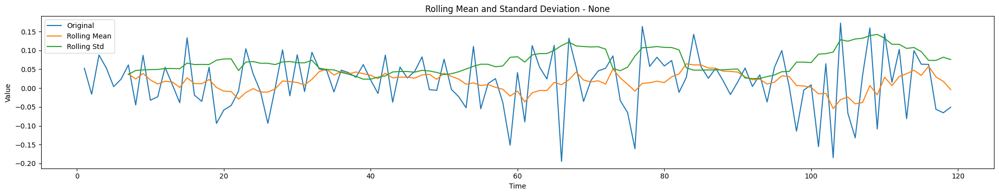

Augumented Dickey-Fuller Test
ADF Statistic: -13.660724591695752
p-value: 1.5232542939420366e-25
Critical Values: {'1%': -3.4870216863700767, '5%': -2.8863625166643136, '10%': -2.580009026141913}


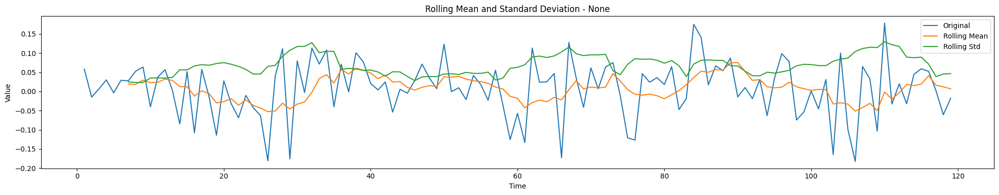

Augumented Dickey-Fuller Test
ADF Statistic: -11.510161157372977
p-value: 4.279139335817911e-21
Critical Values: {'1%': -3.4870216863700767, '5%': -2.8863625166643136, '10%': -2.580009026141913}


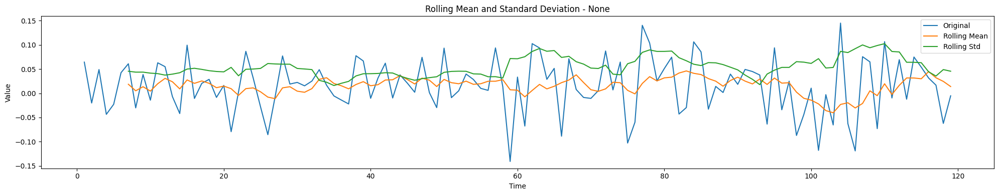

Augumented Dickey-Fuller Test
ADF Statistic: -9.340196292464933
p-value: 8.839318864264295e-16
Critical Values: {'1%': -3.487517288664615, '5%': -2.8865777180380032, '10%': -2.5801239192052012}


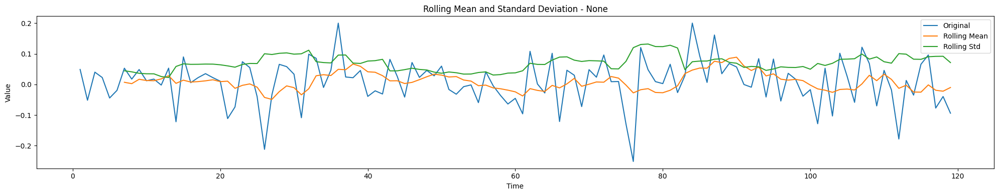

Augumented Dickey-Fuller Test
ADF Statistic: -10.890610142007276
p-value: 1.2278825390650012e-19
Critical Values: {'1%': -3.4870216863700767, '5%': -2.8863625166643136, '10%': -2.580009026141913}


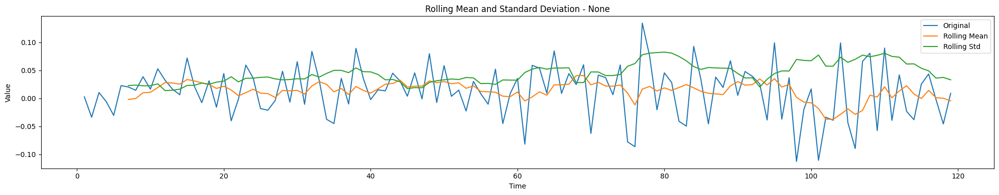

Augumented Dickey-Fuller Test
ADF Statistic: -13.00059304547139
p-value: 2.692477865704607e-24
Critical Values: {'1%': -3.4870216863700767, '5%': -2.8863625166643136, '10%': -2.580009026141913}


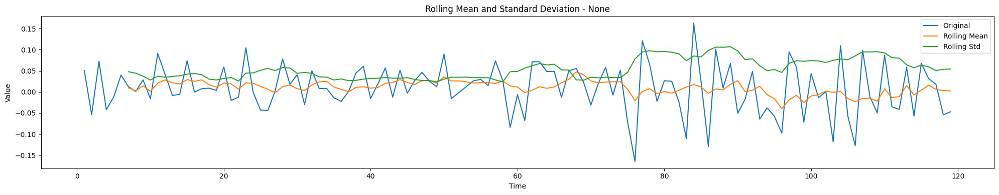

Augumented Dickey-Fuller Test
ADF Statistic: -10.966182041402373
p-value: 8.092802529889139e-20
Critical Values: {'1%': -3.487517288664615, '5%': -2.8865777180380032, '10%': -2.5801239192052012}


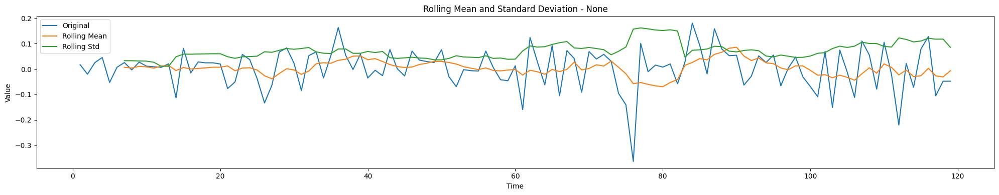

Augumented Dickey-Fuller Test
ADF Statistic: -11.066059815671366
p-value: 4.678567783069251e-20
Critical Values: {'1%': -3.4870216863700767, '5%': -2.8863625166643136, '10%': -2.580009026141913}


In [21]:
for index in mo_index:
    test_stationarity(index)
    

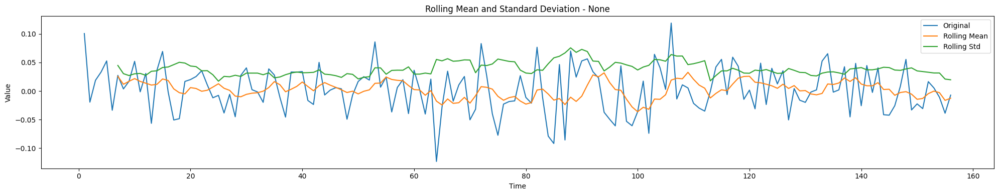

Augumented Dickey-Fuller Test
ADF Statistic: -12.586308303700134
p-value: 1.8626486469219616e-23
Critical Values: {'1%': -3.4732590518613002, '5%': -2.880374082105334, '10%': -2.5768120811654525}


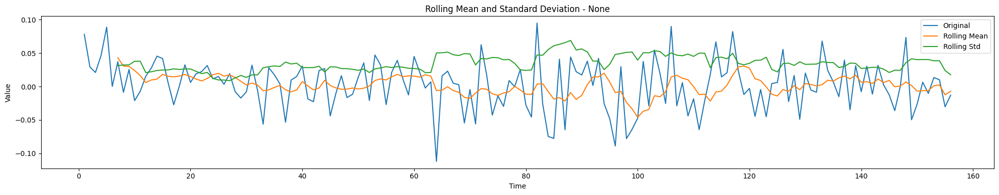

Augumented Dickey-Fuller Test
ADF Statistic: -12.533521972526342
p-value: 2.3994796677240568e-23
Critical Values: {'1%': -3.4732590518613002, '5%': -2.880374082105334, '10%': -2.5768120811654525}


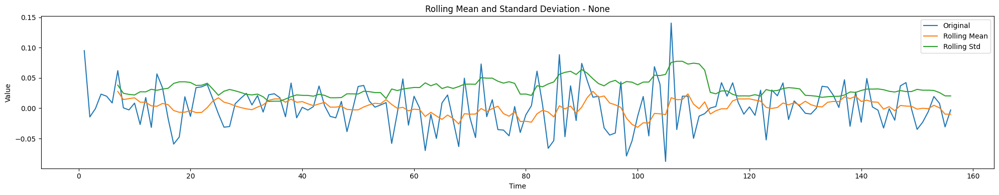

Augumented Dickey-Fuller Test
ADF Statistic: -14.48562784185636
p-value: 6.268048657490728e-27
Critical Values: {'1%': -3.4732590518613002, '5%': -2.880374082105334, '10%': -2.5768120811654525}


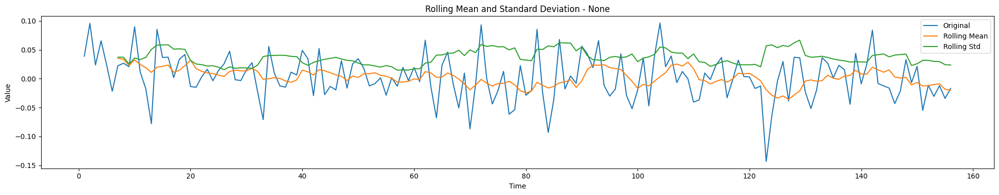

Augumented Dickey-Fuller Test
ADF Statistic: -6.376437822984785
p-value: 2.277706513353974e-08
Critical Values: {'1%': -3.4744158894942156, '5%': -2.880878382771059, '10%': -2.577081275821236}


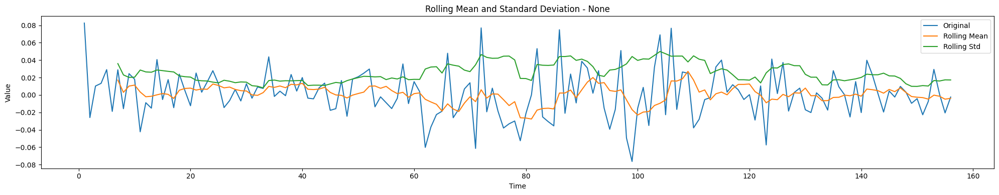

Augumented Dickey-Fuller Test
ADF Statistic: -14.151175286010274
p-value: 2.1605544851031163e-26
Critical Values: {'1%': -3.4732590518613002, '5%': -2.880374082105334, '10%': -2.5768120811654525}


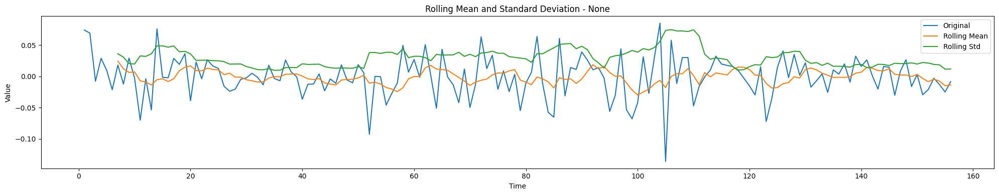

Augumented Dickey-Fuller Test
ADF Statistic: -13.723771162663393
p-value: 1.1745154186335905e-25
Critical Values: {'1%': -3.4732590518613002, '5%': -2.880374082105334, '10%': -2.5768120811654525}


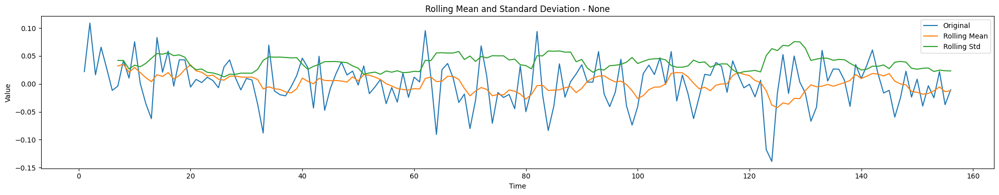

Augumented Dickey-Fuller Test
ADF Statistic: -9.25365747624414
p-value: 1.4692565159488926e-15
Critical Values: {'1%': -3.473542528196209, '5%': -2.880497674144038, '10%': -2.576878053634677}


In [42]:
for index in we_index:
    test_stationarity(index)
    

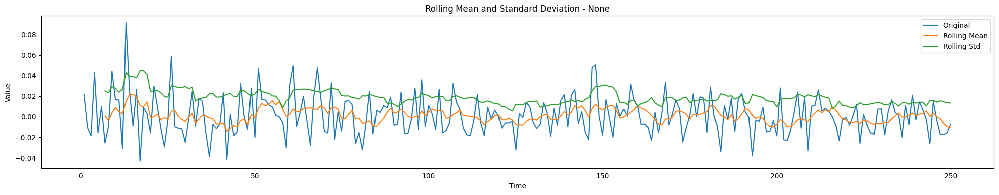

Augumented Dickey-Fuller Test
ADF Statistic: -12.43014750140233
p-value: 3.9570849278272577e-23
Critical Values: {'1%': -3.4569962781990573, '5%': -2.8732659015936024, '10%': -2.573018897632674}


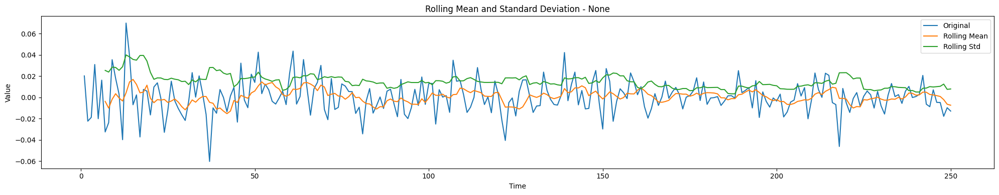

Augumented Dickey-Fuller Test
ADF Statistic: -12.353803049195847
p-value: 5.746274224349255e-23
Critical Values: {'1%': -3.4569962781990573, '5%': -2.8732659015936024, '10%': -2.573018897632674}


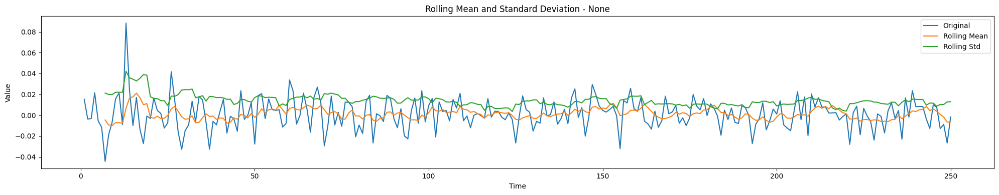

Augumented Dickey-Fuller Test
ADF Statistic: -9.269771854831752
p-value: 1.3365429363637998e-15
Critical Values: {'1%': -3.457215237265747, '5%': -2.873361841566324, '10%': -2.5730700760129555}


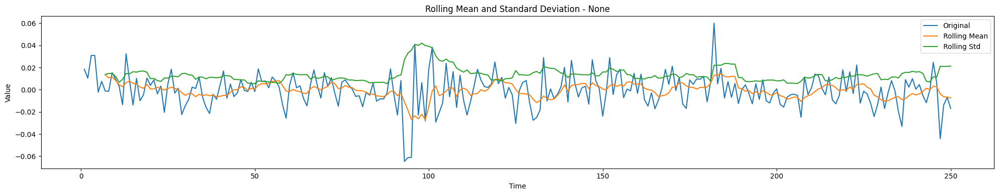

Augumented Dickey-Fuller Test
ADF Statistic: -7.358530536654632
p-value: 9.636458302281261e-11
Critical Values: {'1%': -3.457215237265747, '5%': -2.873361841566324, '10%': -2.5730700760129555}


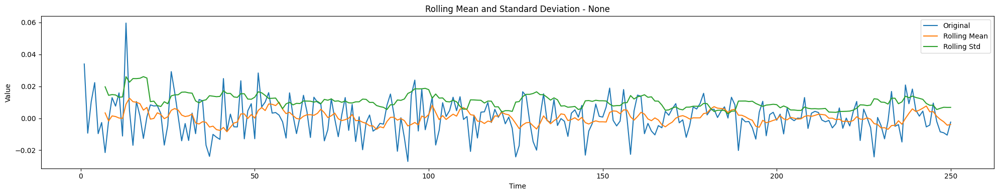

Augumented Dickey-Fuller Test
ADF Statistic: -12.218217343272721
p-value: 1.1228159609877919e-22
Critical Values: {'1%': -3.4569962781990573, '5%': -2.8732659015936024, '10%': -2.573018897632674}


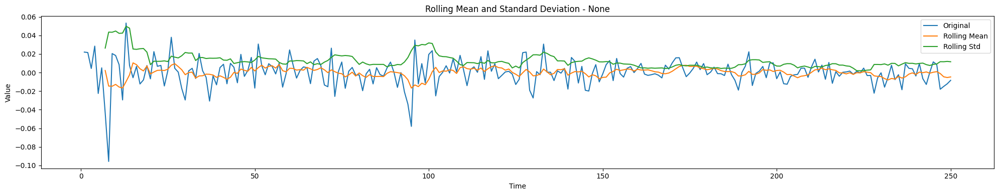

Augumented Dickey-Fuller Test
ADF Statistic: -15.731019519258155
p-value: 1.2893891647638754e-28
Critical Values: {'1%': -3.4568881317725864, '5%': -2.8732185133016057, '10%': -2.5729936189738876}


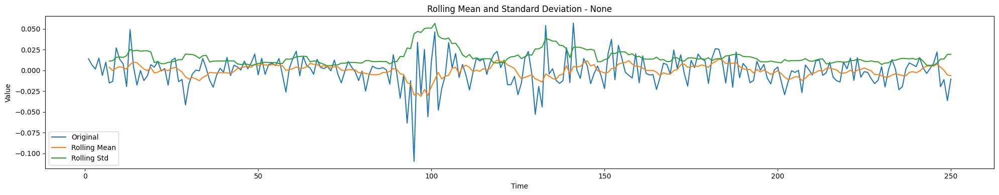

Augumented Dickey-Fuller Test
ADF Statistic: -9.103189720722256
p-value: 3.559785662525351e-15
Critical Values: {'1%': -3.457105309726321, '5%': -2.873313676101283, '10%': -2.5730443824681606}


In [59]:
for index in da_index:
    test_stationarity(index)
    

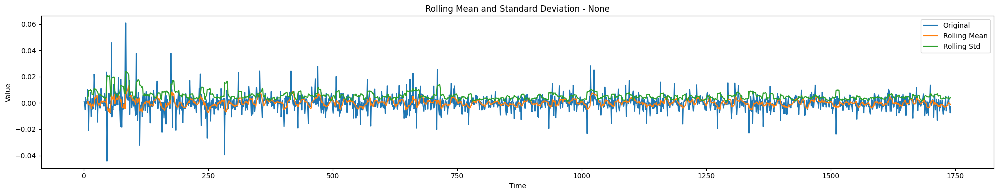

Augumented Dickey-Fuller Test
ADF Statistic: -16.752421391367356
p-value: 1.330554733002539e-29
Critical Values: {'1%': -3.4341224629678426, '5%': -2.863206331927479, '10%': -2.5676571071932934}


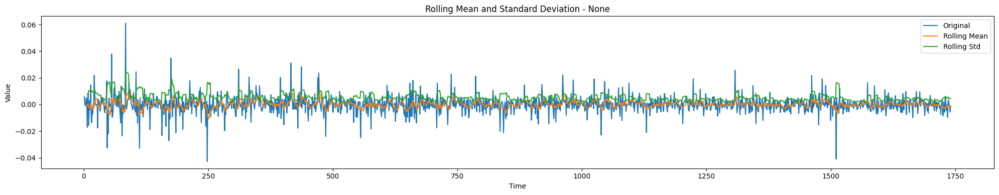

Augumented Dickey-Fuller Test
ADF Statistic: -41.88529821637765
p-value: 0.0
Critical Values: {'1%': -3.4341137777946718, '5%': -2.8632024980220288, '10%': -2.56765506572863}


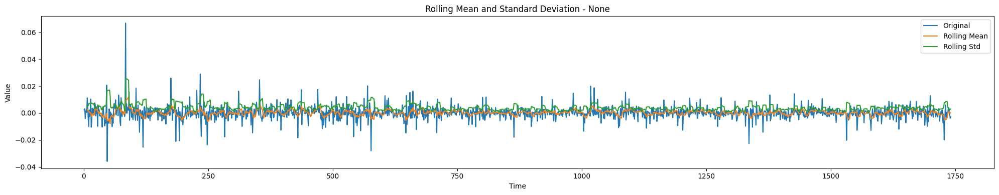

Augumented Dickey-Fuller Test
ADF Statistic: -13.488611342948714
p-value: 3.1381486476202754e-25
Critical Values: {'1%': -3.434126820603039, '5%': -2.8632082555189444, '10%': -2.5676581314612825}


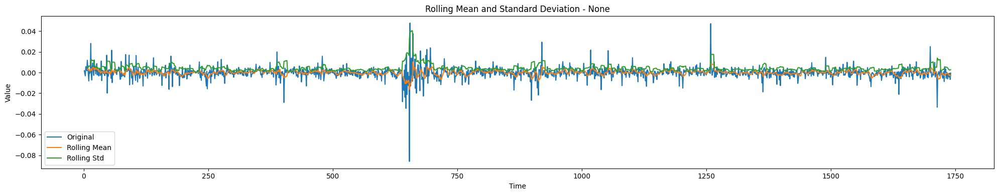

Augumented Dickey-Fuller Test
ADF Statistic: -11.87962698108526
p-value: 6.2219967596264155e-22
Critical Values: {'1%': -3.434133375964546, '5%': -2.8632111492477503, '10%': -2.5676596723058402}


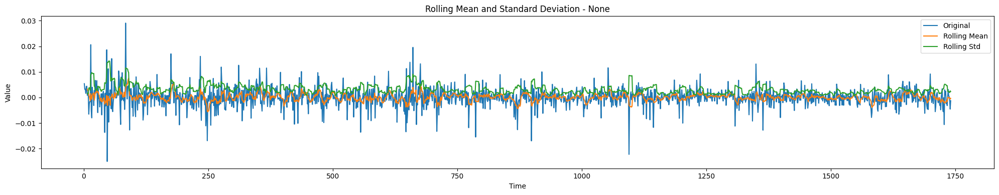

Augumented Dickey-Fuller Test
ADF Statistic: -12.437819096660338
p-value: 3.812134857956837e-23
Critical Values: {'1%': -3.434142151927035, '5%': -2.863215023205043, '10%': -2.5676617351013182}


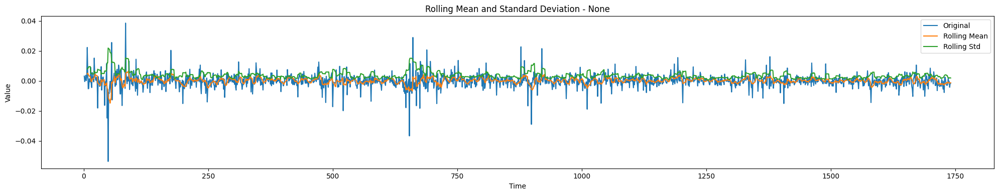

Augumented Dickey-Fuller Test
ADF Statistic: -26.565256996016657
p-value: 0.0
Critical Values: {'1%': -3.4341159453366448, '5%': -2.863203454843483, '10%': -2.5676555752134256}


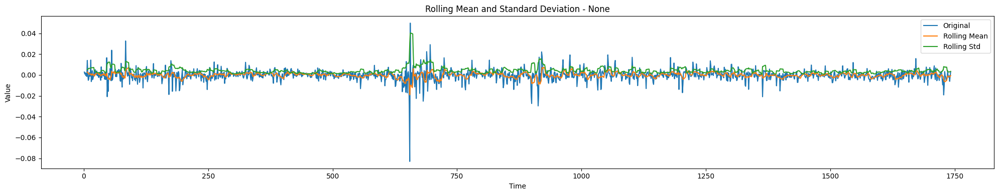

Augumented Dickey-Fuller Test
ADF Statistic: -11.587688048394483
p-value: 2.8412655354916017e-21
Critical Values: {'1%': -3.4341311883170507, '5%': -2.8632101835566965, '10%': -2.567659158097275}


In [10]:
for index in ho_index:
    test_stationarity(index)
    

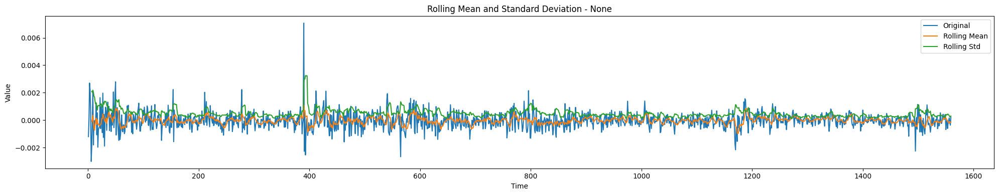

Augumented Dickey-Fuller Test
ADF Statistic: -23.334038473228194
p-value: 0.0
Critical Values: {'1%': -3.4345595891554566, '5%': -2.863399278674411, '10%': -2.5677598491451947}


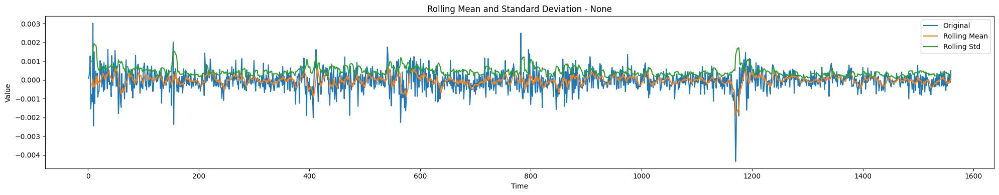

Augumented Dickey-Fuller Test
ADF Statistic: -14.502095433575382
p-value: 5.909590095775741e-27
Critical Values: {'1%': -3.434565015890899, '5%': -2.8634016738494283, '10%': -2.567761124577418}


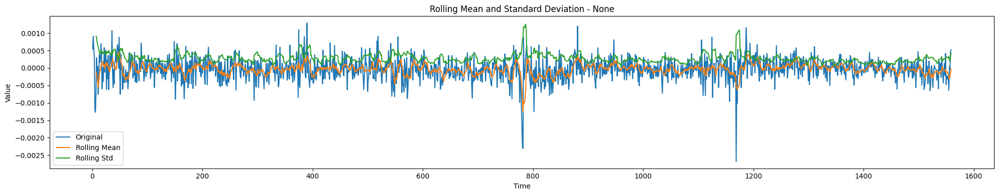

Augumented Dickey-Fuller Test
ADF Statistic: -6.87788182855036
p-value: 1.458712107247082e-09
Critical Values: {'1%': -3.4346061667443037, '5%': -2.8634198362847085, '10%': -2.5677707961086265}


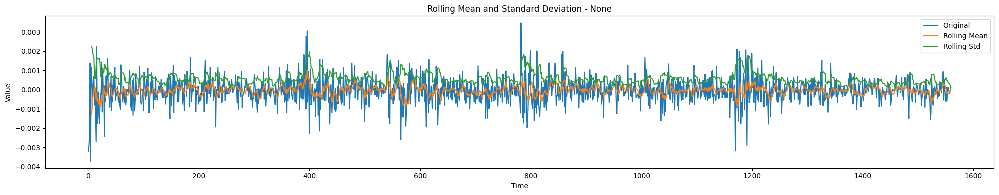

Augumented Dickey-Fuller Test
ADF Statistic: -9.740034384974498
p-value: 8.544306487032917e-17
Critical Values: {'1%': -3.4346033983723516, '5%': -2.863418614437511, '10%': -2.5677701454714117}


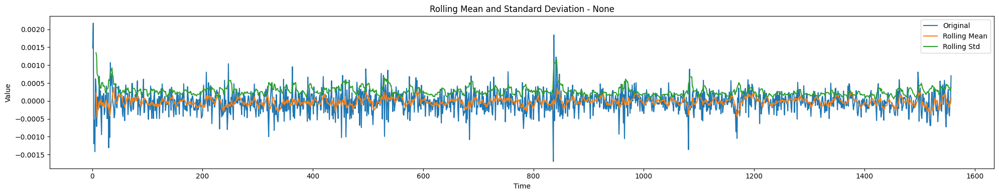

Augumented Dickey-Fuller Test
ADF Statistic: -9.820823909284453
p-value: 5.3440340888570094e-17
Critical Values: {'1%': -3.4346033983723516, '5%': -2.863418614437511, '10%': -2.5677701454714117}


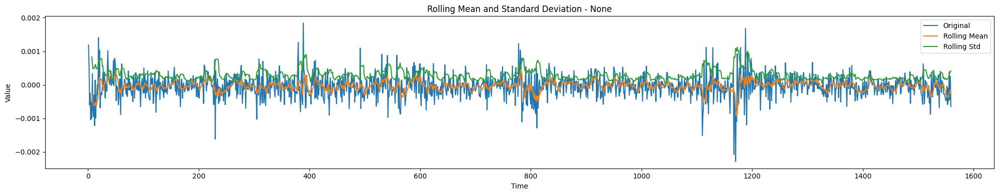

Augumented Dickey-Fuller Test
ADF Statistic: -10.373309126351426
p-value: 2.2347601488942754e-18
Critical Values: {'1%': -3.4345868634742787, '5%': -2.8634113165800716, '10%': -2.567766259344735}


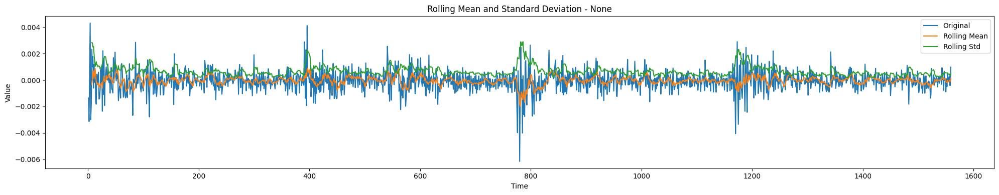

Augumented Dickey-Fuller Test
ADF Statistic: -9.377343254491182
p-value: 7.108655515161667e-16
Critical Values: {'1%': -3.4346033983723516, '5%': -2.863418614437511, '10%': -2.5677701454714117}


In [11]:
for index in mi_index:
    test_stationarity(index)
    

# Find VAR lag orders (MAIC, MSBIC, MHQIC)

In [96]:
df_mo = pd.concat(mo_index, axis=1)
df_mo.columns = ["sc_mo_index", "hd_mo_index", "sw_mo_index", "ib_mo_index", "fx_mo_index", "tp_mo_index", "db_mo_index"]
var_mo = VAR(df_mo)
mo_order = var_mo.select_order(maxlags = 12)
print(mo_order)
print(mo_order.summary())

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 12, BIC -> 0, FPE -> 0, HQIC ->  0>
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -44.28     -44.10*  5.900e-20*     -44.21*
1       -44.06      -42.66   7.343e-20      -43.49
2       -43.80      -41.18   9.609e-20      -42.74
3       -43.67      -39.83   1.124e-19      -42.11
4       -43.34      -38.27   1.658e-19      -41.28
5       -42.87      -36.57   2.923e-19      -40.32
6       -42.79      -35.27   3.653e-19      -39.74
7       -42.58      -33.84   5.564e-19      -39.04
8       -42.43      -32.46   8.804e-19      -38.39
9       -42.89      -31.70   8.542e-19      -38.36
10      -43.19      -30.78   1.163e-18      -38.16
11      -43.57      -29.93   1.904e-18      -38.04
12     -44.54*      -29.67   2.594e-18      -38.51
--------------------------------------------------


##### no VAR appropriate-maxlags lag for monthly data . try weekly next

In [98]:
df_we = pd.concat(we_index, axis=1)
df_we.columns = ["sc_we_index", "hd_we_index", "sw_we_index", "ib_we_index", "fx_we_index", "tp_we_index", "db_we_index"]
var_we = VAR(df_we)
we_order = var_we.select_order(maxlags = 16)
print(we_order)
print(we_order.summary())

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 16, BIC -> 0, FPE -> 0, HQIC ->  0>
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -52.74     -52.59*  1.247e-23*     -52.68*
1       -52.37      -51.19   1.811e-23      -51.89
2       -52.03      -49.82   2.548e-23      -51.13
3       -51.71      -48.48   3.547e-23      -50.40
4       -51.42      -47.16   4.849e-23      -49.69
5       -51.26      -45.96   5.971e-23      -49.10
6       -51.29      -44.97   6.120e-23      -48.72
7       -51.14      -43.79   7.757e-23      -48.15
8       -51.03      -42.65   9.784e-23      -47.62
9       -51.10      -41.69   1.071e-22      -47.27
10      -51.27      -40.82   1.122e-22      -47.02
11      -51.40      -39.93   1.291e-22      -46.74
12      -51.54      -39.04   1.615e-22      -46.46
13      -51.64      -38.11   2.329e-22      -46.14
14      

##### no VAR appropriate-maxlags lag for weekly data. try daily next

In [61]:
df_da = pd.concat(da_index, axis=1)
df_da.columns = ["sc_da_index", "hd_da_index", "sw_da_index", "ib_da_index", "fx_da_index", "tp_da_index", "db_da_index"]
var_da = VAR(df_da)
da_order = var_da.select_order(maxlags = 30)
print(da_order)
print(da_order.summary())

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 30, BIC -> 0, FPE -> 0, HQIC ->  30>
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -64.38     -64.27*  1.096e-28*      -64.34
1       -64.30      -63.44   1.187e-28      -63.95
2       -64.13      -62.51   1.416e-28      -63.47
3       -63.94      -61.57   1.703e-28      -62.99
4       -63.67      -60.54   2.245e-28      -62.41
5       -63.46      -59.57   2.809e-28      -61.89
6       -63.42      -58.77   2.979e-28      -61.54
7       -63.20      -57.81   3.760e-28      -61.02
8       -63.08      -56.93   4.372e-28      -60.60
9       -62.97      -56.06   5.059e-28      -60.18
10      -62.88      -55.21   5.813e-28      -59.78
11      -62.74      -54.32   7.085e-28      -59.34
12      -62.57      -53.39   8.993e-28      -58.87
13      -62.45      -52.51   1.109e-27      -58.44
14     

##### no VAR appropriate-maxlags lag for daily data. try hourly next

In [28]:
df_ho = pd.concat(ho_index, axis=1).interpolate()
df_ho.columns = ["ib_ho_index", "fx_ho_index", "sc_ho_index", "hd_ho_index", "sw_ho_index", "tp_ho_index", "db_ho_index"]
var_ho = VAR(df_ho)
ho_order = var_ho.select_order(maxlags = 48)
print(ho_order)
print(ho_order.summary())

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 7, BIC -> 1, FPE -> 7, HQIC ->  1>
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -77.56      -77.54   2.075e-34      -77.55
1       -77.86     -77.69*   1.527e-34     -77.80*
2       -77.91      -77.57   1.459e-34      -77.79
3       -77.88      -77.38   1.508e-34      -77.69
4       -77.84      -77.19   1.563e-34      -77.60
5       -77.82      -77.02   1.593e-34      -77.52
6       -77.81      -76.85   1.612e-34      -77.45
7      -77.92*      -76.80  1.438e-34*      -77.51
8       -77.91      -76.63   1.458e-34      -77.44
9       -77.89      -76.45   1.494e-34      -77.36
10      -77.86      -76.27   1.532e-34      -77.27
11      -77.83      -76.08   1.580e-34      -77.18
12      -77.80      -75.90   1.622e-34      -77.10
13      -77.78      -75.72   1.660e-34      -77.02
14      -

##### MAIC and FPE suggested 2 order, MSBIC and MHQIC suggested 1 order

In [29]:
df_mi = pd.concat(mi_index, axis=1).interpolate()
df_mi.columns = ["sw_mi_index", "tp_mi_index", "sc_mi_index", "ib_mi_index", "hd_mi_index", "fx_mi_index", "db_mi_index"]
var_mi = VAR(df_mi)
mi_order = var_mi.select_order(maxlags = 120)
print(mi_order)
print(mi_order.summary())

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 5, BIC -> 1, FPE -> 5, HQIC ->  1>
  VAR Order Selection (* highlights the minimums)  
        AIC         BIC         FPE         HQIC   
---------------------------------------------------
0        -108.2      -108.2   1.045e-47      -108.2
1        -108.4     -108.2*   8.242e-48     -108.3*
2        -108.5      -108.1   7.806e-48      -108.3
3        -108.5      -108.0   7.374e-48      -108.3
4        -108.6      -107.9   7.125e-48      -108.3
5       -108.6*      -107.8  6.595e-48*      -108.3
6        -108.6      -107.6   6.699e-48      -108.3
7        -108.6      -107.4   6.879e-48      -108.2
8        -108.6      -107.3   6.822e-48      -108.1
9        -108.6      -107.1   6.969e-48      -108.0
10       -108.6      -106.9   7.026e-48      -108.0
11       -108.5      -106.8   7.216e-48      -107.9
12       -108.5      -106.6   7.272e-48      -107.8
13       -108.5      -106.4   7.435e-48     

##### MAIC and FPE suggested 5 order, MSBIC and MHQIC suggested 1 order

# Model estimation & evaluation

### For hourly data 

In [30]:
hourly_VAR = var_ho.fit(7)
hourly_VAR.summary()


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 25, Oct, 2023
Time:                     02:17:52
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                   -76.7080
Nobs:                     1739.00    HQIC:                  -77.4007
Log likelihood:           50730.5    FPE:                1.61753e-34
AIC:                     -77.8071    Det(Omega_mle):     1.32641e-34
--------------------------------------------------------------------
Results for equation ib_ho_index
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.000109         0.000130           -0.840           0.401
L1.ib_ho_index        -0.034724         0.031703           -1.095           0.273
L1.fx_ho_index         0.105113         0.049488  

In [162]:
var_ho_mle = VARMAX(df_ho, order=(2,0))
MLEVAR_ho = var_ho_mle.fit()


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          133     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.89981D+01    |proj g|=  4.22154D+00


 This problem is unconstrained.



At iterate    5    f= -2.89982D+01    |proj g|=  1.09869D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  133      5     38      1     0     0   1.099D+00  -2.900D+01
  F =  -28.998216470295244     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


In [163]:
MLEVAR_ho.summary()

Dep. Variable:,"['sc_ho_index', 'hd_ho_index', 'sw_ho_index', 'ib_ho_index', 'fx_ho_index', 'tp_ho_index', 'db_ho_index']",No. Observations:,1742
Model:,VAR(2),Log Likelihood,50514.893
,+ intercept,AIC,-100763.786
Date:,"Tue, 24 Oct 2023",BIC,-100037.235
Time:,19:58:52,HQIC,-100495.145
Sample:,0,,
,- 1742,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.00, 0.01, 0.00, 0.13, 0.01, 0.00, 0.00",Jarque-Bera (JB):,"11402.36, 4371.21, 16388.87, 179764.38, 10043.20, 110796.01, 171668.97"
Prob(Q):,"0.99, 0.91, 0.99, 0.72, 0.90, 0.99, 0.95",Prob(JB):,"0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00"
Heteroskedasticity (H):,"0.34, 0.70, 0.46, 1.06, 0.61, 0.46, 0.77",Skew:,"0.64, 0.10, -0.38, -1.88, -0.42, -2.15, -2.33"


In [31]:
for column in df_ho.columns:
    print(column)
    target = column
    coefficients = pd.DataFrame(hourly_VAR.params[target])
    p_values = pd.DataFrame(hourly_VAR.pvalues[target])

    df_VAR = pd.concat([coefficients, p_values], axis=1)
    df_VAR.columns = ['Coefficients', 'p-values']

    df_VAR_filtered = df_VAR[df_VAR['p-values'] < 0.1].dropna()
    print(df_VAR_filtered)
    print("\n")


ib_ho_index
                Coefficients      p-values
L1.fx_ho_index      0.105113  3.367114e-02
L1.db_ho_index     -0.124757  2.044861e-04
L2.ib_ho_index      0.291431  3.281520e-17
L2.fx_ho_index     -0.164087  9.266753e-04
L2.db_ho_index     -0.096136  4.453335e-03
L3.ib_ho_index      0.105361  2.800063e-03
L3.db_ho_index     -0.056311  9.743134e-02
L4.fx_ho_index      0.088732  7.568126e-02
L5.sc_ho_index     -0.068612  7.172370e-02
L5.sw_ho_index      0.100939  2.409384e-02
L5.db_ho_index      0.123190  2.869612e-04
L6.fx_ho_index     -0.115727  2.023520e-02
L6.db_ho_index     -0.101278  2.833425e-03
L7.ib_ho_index      0.072476  3.355185e-02
L7.hd_ho_index     -0.068587  4.605859e-02
L7.sw_ho_index      0.178911  6.638683e-05
L7.tp_ho_index     -0.115721  6.014145e-03
L7.db_ho_index      0.121633  2.777765e-05


fx_ho_index
                Coefficients      p-values
L1.db_ho_index     -0.064487  4.030137e-03
L2.ib_ho_index      0.109333  2.118989e-06
L2.fx_ho_index     -0.114504

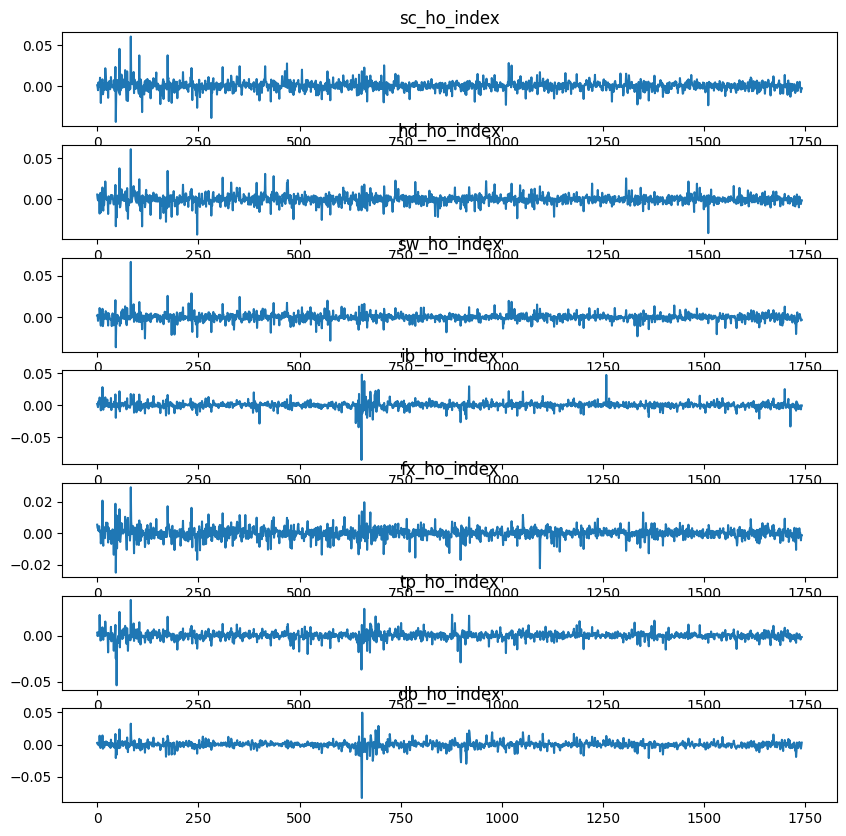

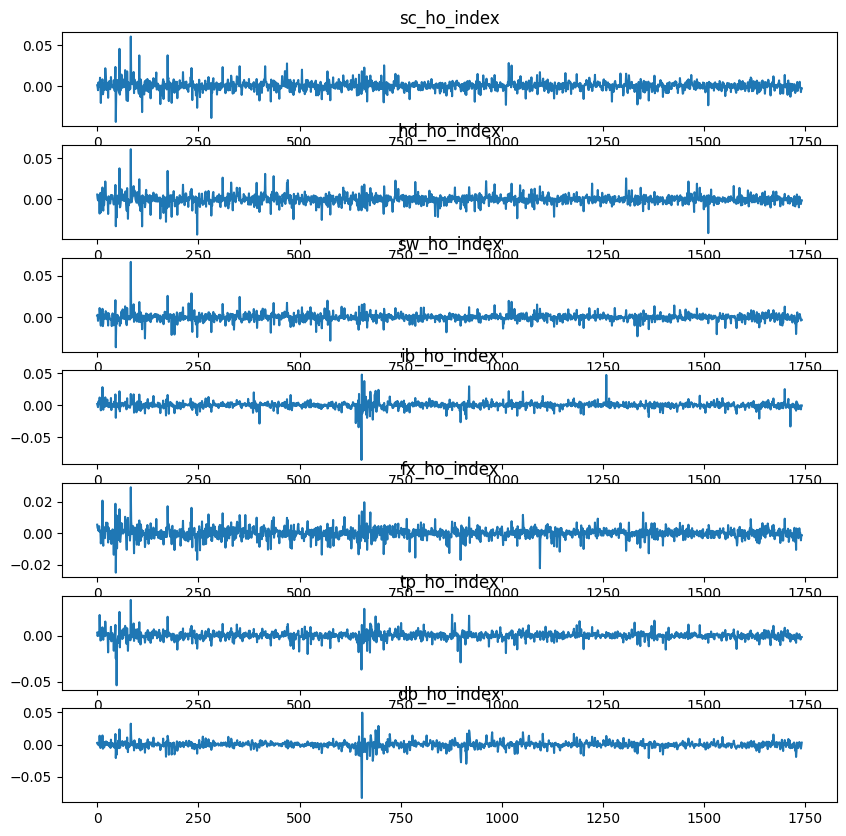

In [172]:
hourly_VAR.plot()

In [32]:
hourly_VAR.mse(50)

array([[[2.88050506e-05, 8.12189953e-06, 1.37902707e-05, ...,
         8.83098027e-06, 1.24597868e-05, 1.44870818e-05],
        [8.12189953e-06, 1.28323234e-05, 1.15677116e-05, ...,
         1.07583240e-05, 7.95382591e-06, 6.79626571e-06],
        [1.37902707e-05, 1.15677116e-05, 3.59819431e-05, ...,
         2.11123651e-05, 1.36644172e-05, 1.18385491e-05],
        ...,
        [8.83098027e-06, 1.07583240e-05, 2.11123651e-05, ...,
         2.28949968e-05, 1.10007683e-05, 7.90880187e-06],
        [1.24597868e-05, 7.95382591e-06, 1.36644172e-05, ...,
         1.10007683e-05, 1.85808904e-05, 1.08635479e-05],
        [1.44870818e-05, 6.79626571e-06, 1.18385491e-05, ...,
         7.90880187e-06, 1.08635479e-05, 2.41614129e-05]],

       [[2.93366051e-05, 8.30507423e-06, 1.38464481e-05, ...,
         8.90339380e-06, 1.25790735e-05, 1.37411748e-05],
        [8.30507423e-06, 1.29326965e-05, 1.16216552e-05, ...,
         1.07992527e-05, 8.02830831e-06, 6.66720855e-06],
        [1.38464481e-05, 

### For minutely data

In [33]:
minutely_VAR = var_mi.fit(5)
minutely_VAR.summary()


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 25, Oct, 2023
Time:                     02:18:44
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                   -107.502
Nobs:                     1763.00    HQIC:                  -107.995
Log likelihood:           78193.4    FPE:                9.39271e-48
AIC:                     -108.284    Det(Omega_mle):     8.15340e-48
--------------------------------------------------------------------
Results for equation sw_mi_index
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.000030         0.000009           -3.375           0.001
L1.sw_mi_index         0.046370         0.025123            1.846           0.065
L1.tp_mi_index         0.071251         0.022512  

In [164]:
var_mi_mle = VARMAX(df_mi, order=(5,0))
MLEVAR_mi = var_mi_mle.fit()
MLEVAR_mi.summary()


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          280     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.47480D+01    |proj g|=  1.59612D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  280      4     55      2     0     0   6.285D+01  -4.475D+01
  F =  -44.750781763434020     

ABNORMAL_TERMINATION_IN_LNSRCH                              


Dep. Variable:,"['sc_mi_index', 'hd_mi_index', 'sw_mi_index', 'ib_mi_index', 'fx_mi_index', 'tp_mi_index', 'db_mi_index']",No. Observations:,1559
Model:,VAR(5),Log Likelihood,69766.469
,+ intercept,AIC,-138972.938
Date:,"Tue, 24 Oct 2023",BIC,-137474.434
Time:,20:15:02,HQIC,-138415.768
Sample:,0,,
,- 1559,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.01, 0.05, 0.16, 2.39, 0.25, 0.26, 0.14",Jarque-Bera (JB):,"7070.01, 2496.43, 1965.26, 1159.20, 1364.40, 600.16, 3526.45"
Prob(Q):,"0.92, 0.82, 0.69, 0.12, 0.62, 0.61, 0.71",Prob(JB):,"0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00"
Heteroskedasticity (H):,"0.32, 0.68, 0.75, 0.44, 0.63, 0.81, 0.56",Skew:,"0.82, -0.74, -0.66, -0.28, 0.26, -0.02, -0.63"


In [34]:
for column in df_mi.columns:
    print(column)
    target = column
    coefficients = pd.DataFrame(minutely_VAR.params[target])
    p_values = pd.DataFrame(minutely_VAR.pvalues[target])

    df_VAR = pd.concat([coefficients, p_values], axis=1)
    df_VAR.columns = ['Coefficients', 'p-values']

    df_VAR_filtered = df_VAR[df_VAR['p-values'] < 0.1].dropna()
    print(df_VAR_filtered)
    print("\n")

sw_mi_index
                Coefficients  p-values
const              -0.000030  0.000738
L1.sw_mi_index      0.046370  0.064937
L1.tp_mi_index      0.071251  0.001551
L1.sc_mi_index      0.045591  0.014235
L2.db_mi_index      0.033312  0.025978
L3.tp_mi_index      0.058276  0.014032
L3.sc_mi_index     -0.045202  0.015611
L3.hd_mi_index      0.054951  0.006378
L4.sw_mi_index      0.057417  0.023007
L4.ib_mi_index     -0.032989  0.063692
L4.db_mi_index      0.044358  0.002948
L5.tp_mi_index     -0.068154  0.004258


tp_mi_index
                Coefficients  p-values
L1.sw_mi_index      0.048845  0.074123
L1.ib_mi_index     -0.039909  0.043041
L1.fx_mi_index      0.086000  0.004961
L2.sc_mi_index     -0.055450  0.006710
L2.hd_mi_index      0.093199  0.000024
L2.db_mi_index     -0.032642  0.045069
L3.tp_mi_index      0.103479  0.000062
L3.sc_mi_index     -0.045331  0.025926
L3.fx_mi_index      0.082312  0.007068
L4.sw_mi_index      0.047708  0.082737
L4.tp_mi_index      0.079552  0.002131

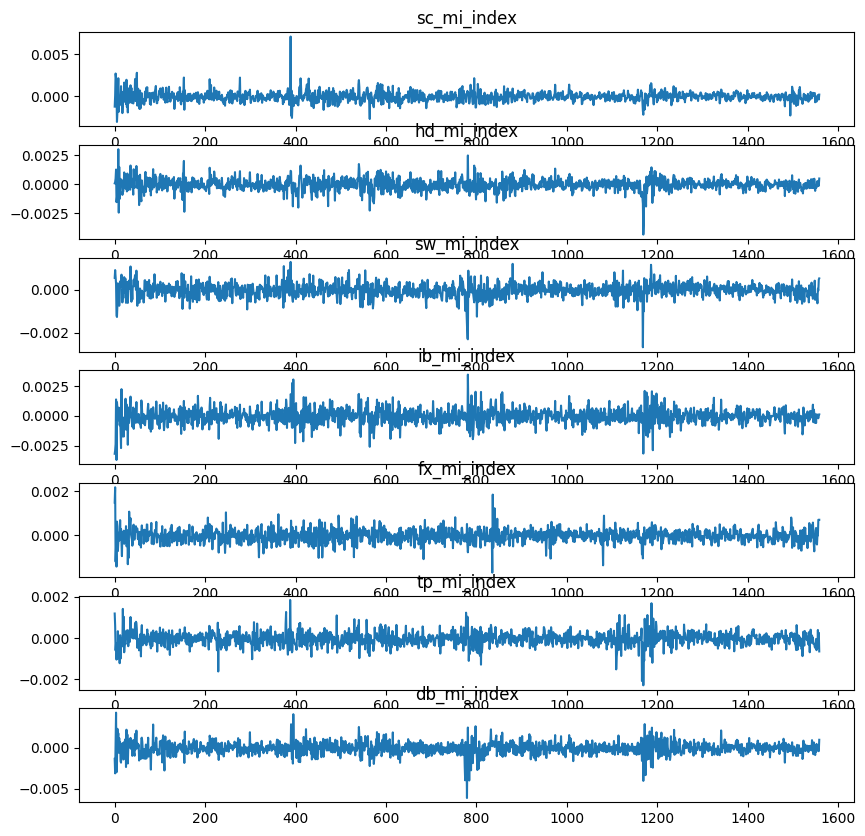

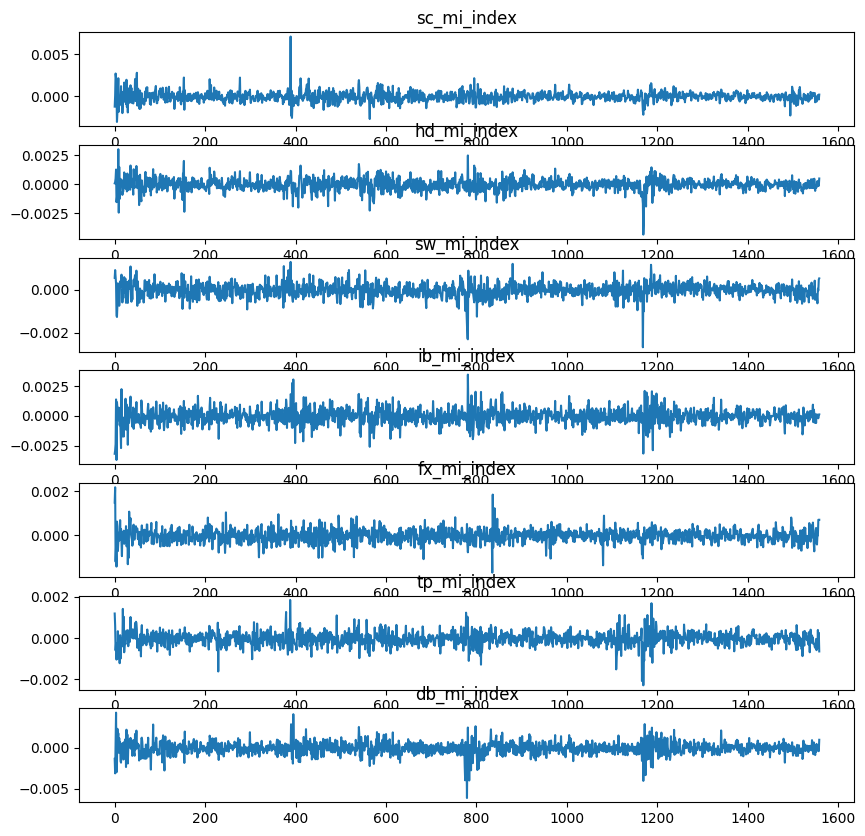

In [177]:
minutely_VAR.plot()

In [37]:
minutely_VAR.mse(50)

array([[[1.24490061e-07, 1.47238611e-08, 5.43695699e-08, ...,
         3.99754503e-08, 7.44220038e-09, 1.95926630e-08],
        [1.47238611e-08, 1.47547420e-07, 3.24926243e-08, ...,
         2.68048278e-08, 1.03338804e-09, 3.50691872e-08],
        [5.43695699e-08, 3.24926243e-08, 3.03756562e-07, ...,
         1.50446478e-07, 1.13667890e-08, 8.01768069e-08],
        ...,
        [3.99754503e-08, 2.68048278e-08, 1.50446478e-07, ...,
         2.65153463e-07, 2.20356913e-08, 1.21967177e-07],
        [7.44220038e-09, 1.03338804e-09, 1.13667890e-08, ...,
         2.20356913e-08, 9.27449482e-08, 1.70866696e-08],
        [1.95926630e-08, 3.50691872e-08, 8.01768069e-08, ...,
         1.21967177e-07, 1.70866696e-08, 5.03077875e-07]],

       [[1.26804372e-07, 1.59027147e-08, 5.81884794e-08, ...,
         4.81516757e-08, 8.60263157e-09, 2.38279447e-08],
        [1.59027147e-08, 1.49018189e-07, 3.45574306e-08, ...,
         3.00020264e-08, 1.19649837e-09, 3.62485118e-08],
        [5.81884794e-08, 

# Granger causality

### For hourly model

In [115]:
causality_vs_all(df_ho, hourly_VAR)

Granger causality F-test. H_0: ['hd_ho_index', 'sw_ho_index', 'ib_ho_index', 'fx_ho_index', 'tp_ho_index', 'db_ho_index'] do not Granger-cause sc_ho_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value      df    
-------------------------------------------------
         3.436          1.753   0.000 (12, 12075)
-------------------------------------------------
Granger causality F-test. H_0: ['sc_ho_index', 'sw_ho_index', 'ib_ho_index', 'fx_ho_index', 'tp_ho_index', 'db_ho_index'] do not Granger-cause hd_ho_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value      df    
-------------------------------------------------
         5.225          1.753   0.000 (12, 12075)
-------------------------------------------------
Granger causality F-test. H_0: ['sc_ho_index', 'hd_ho_index', 'ib_ho_index', 'fx_ho_index', 'tp_ho_index', 'db_ho_index'] do not Granger-cause sw_ho_index. Conclusion: reject H_0 at 5% signi

In [35]:
causality_vs_each(df_ho, hourly_VAR)

Granger causality F-test. H_0: fx_ho_index does not Granger-cause ib_ho_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         4.121          2.010   0.000 (7, 11823)
------------------------------------------------
Granger causality F-test. H_0: sc_ho_index does not Granger-cause ib_ho_index. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         1.309          2.010   0.241 (7, 11823)
------------------------------------------------
Granger causality F-test. H_0: hd_ho_index does not Granger-cause ib_ho_index. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
        0.9800          2.010   0.444 (7, 11823)
------------------------------------------------
Granger caus

### For minutely model

In [117]:
causality_vs_all(df_mi, minutely_VAR)

Granger causality F-test. H_0: ['hd_mi_index', 'sw_mi_index', 'ib_mi_index', 'fx_mi_index', 'tp_mi_index', 'db_mi_index'] do not Granger-cause sc_mi_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value      df    
-------------------------------------------------
         6.315          1.460   0.000 (30, 10626)
-------------------------------------------------
Granger causality F-test. H_0: ['sc_mi_index', 'sw_mi_index', 'ib_mi_index', 'fx_mi_index', 'tp_mi_index', 'db_mi_index'] do not Granger-cause hd_mi_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value      df    
-------------------------------------------------
         11.13          1.460   0.000 (30, 10626)
-------------------------------------------------
Granger causality F-test. H_0: ['sc_mi_index', 'hd_mi_index', 'ib_mi_index', 'fx_mi_index', 'tp_mi_index', 'db_mi_index'] do not Granger-cause sw_mi_index. Conclusion: reject H_0 at 5% signi

In [36]:
causality_vs_each(df_mi, minutely_VAR)

Granger causality F-test. H_0: tp_mi_index does not Granger-cause sw_mi_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         5.509          2.215   0.000 (5, 12089)
------------------------------------------------
Granger causality F-test. H_0: sc_mi_index does not Granger-cause sw_mi_index. Conclusion: reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         3.052          2.215   0.009 (5, 12089)
------------------------------------------------
Granger causality F-test. H_0: ib_mi_index does not Granger-cause sw_mi_index. Conclusion: fail to reject H_0 at 5% significance level.
Test statistic Critical value p-value     df    
------------------------------------------------
         1.534          2.215   0.176 (5, 12089)
------------------------------------------------
Granger causality F-

# Impulse reponse

### For hourly model

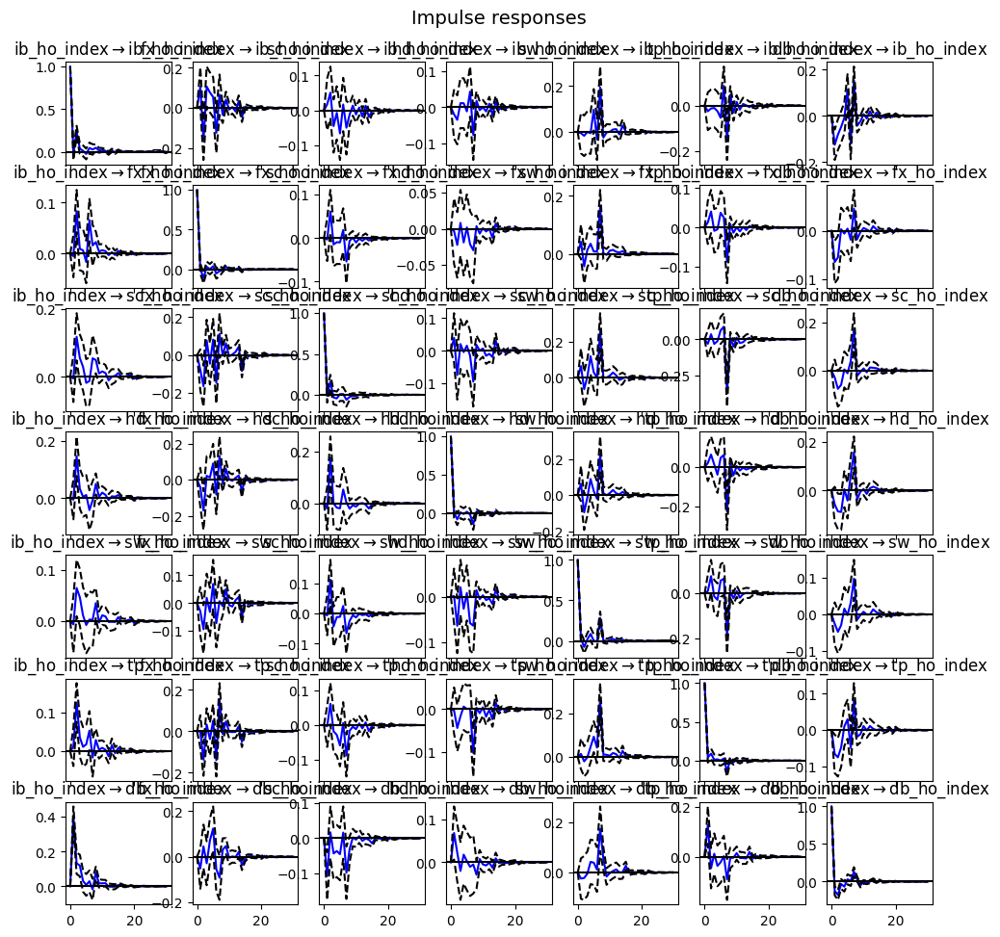

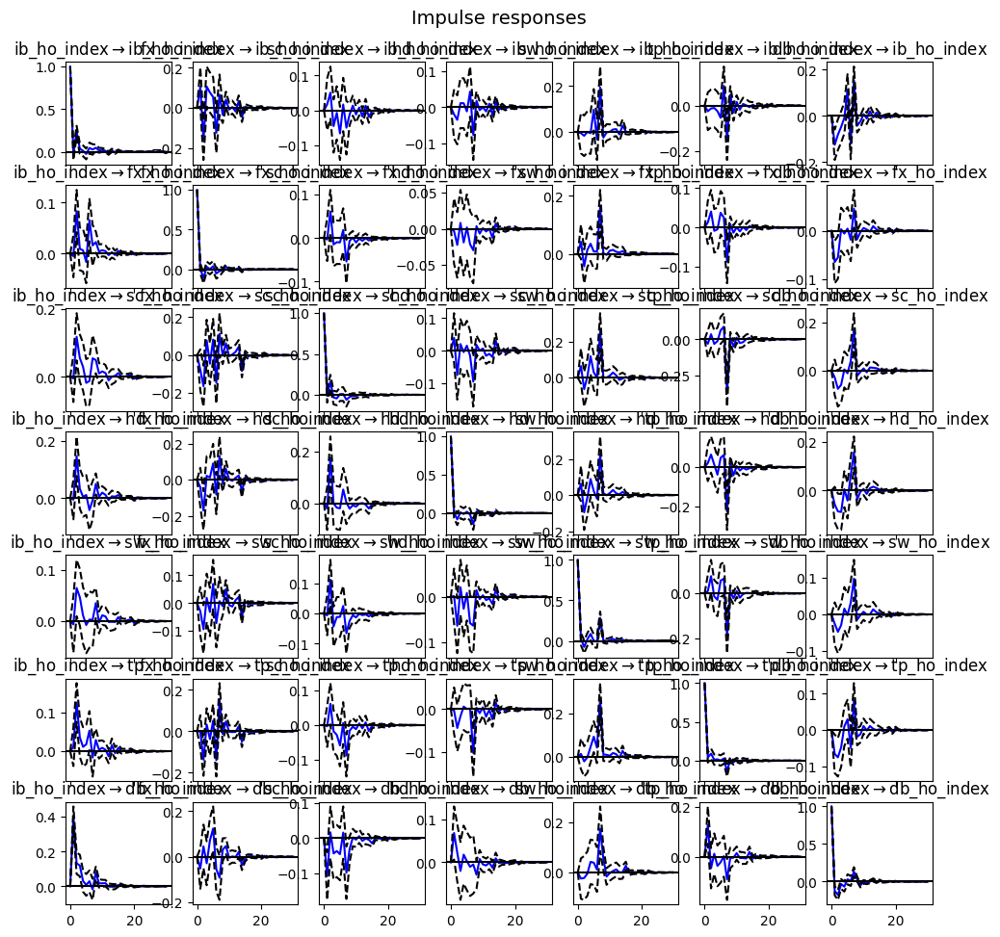

In [38]:
irf_ho = hourly_VAR.irf(30)
irf_ho.plot()

### For minutely model

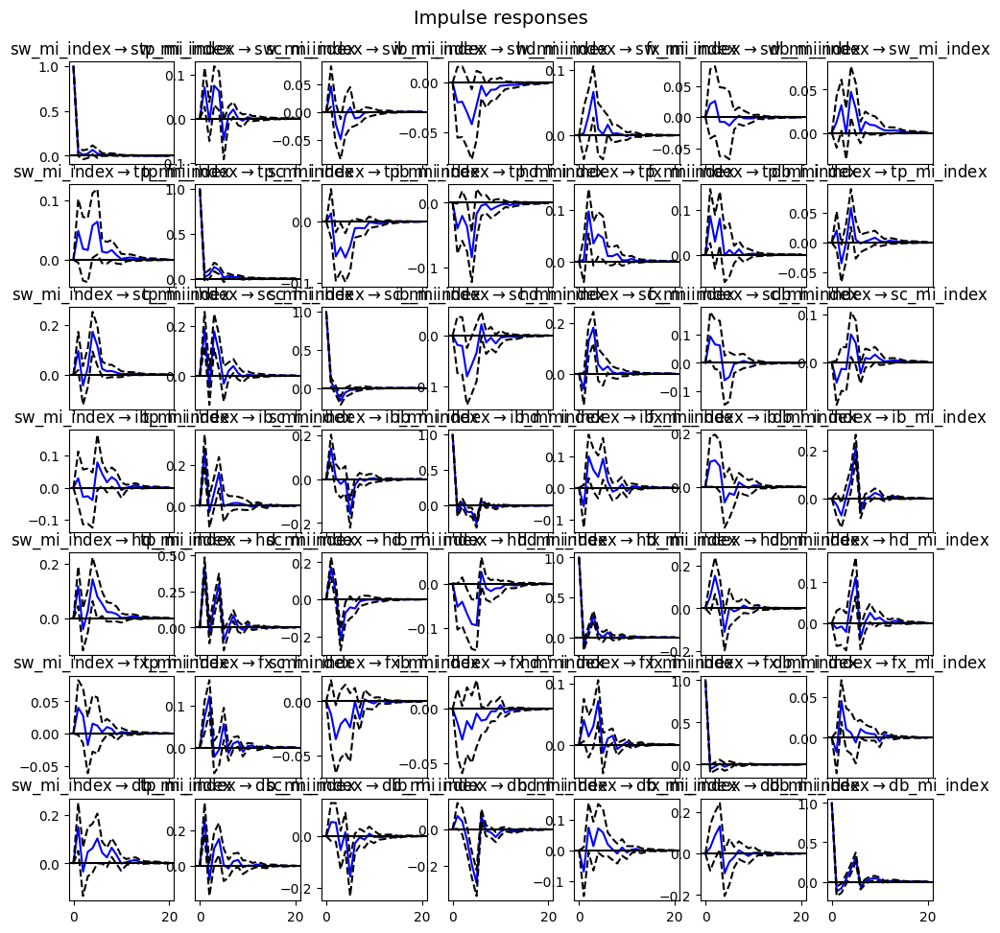

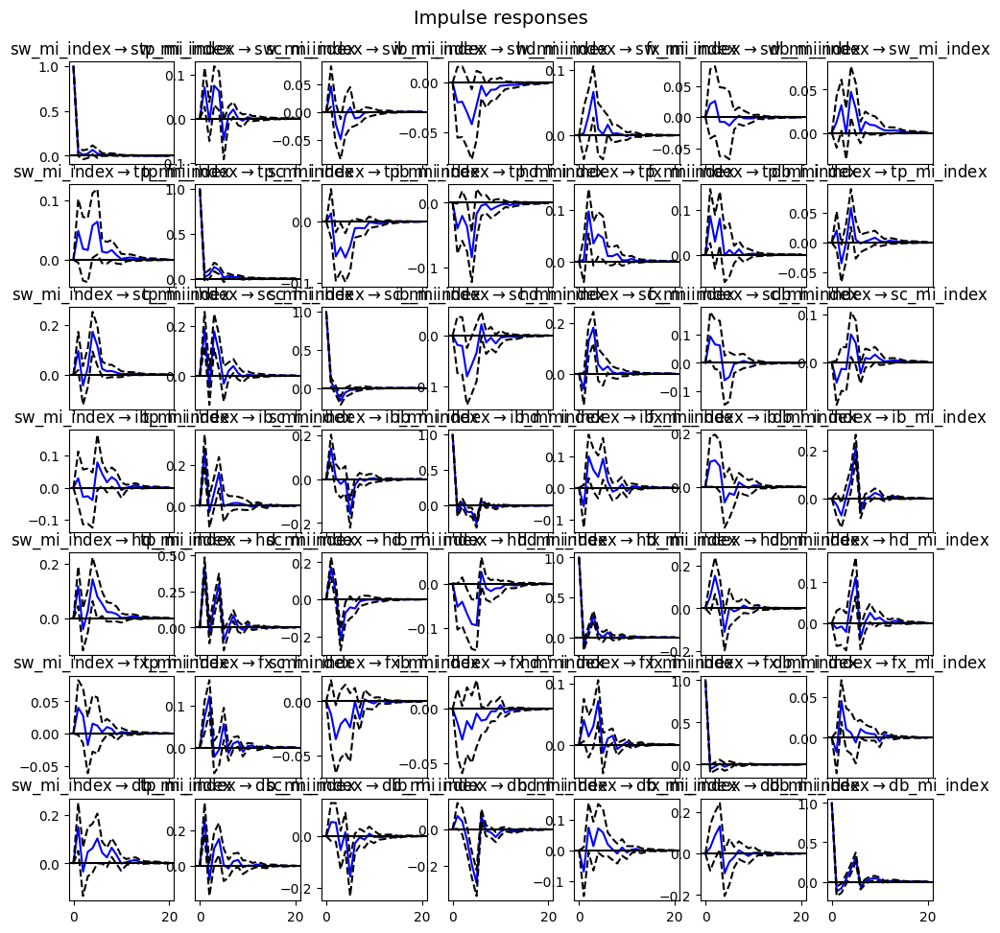

In [39]:
irf_mi = minutely_VAR.irf(20)
irf_mi.plot()

# Variance decomposition

### For hourly model

FEVD for ib_ho_index
     ib_ho_index  fx_ho_index  sc_ho_index  hd_ho_index  sw_ho_index  tp_ho_index  db_ho_index
0       1.000000     0.000000     0.000000     0.000000     0.000000     0.000000     0.000000
1       0.988391     0.001279     0.000236     0.001357     0.000007     0.000945     0.007785
2       0.972087     0.012835     0.000296     0.002857     0.000074     0.001218     0.010634
3       0.967943     0.014232     0.001874     0.002843     0.000074     0.001357     0.011677
4       0.966314     0.015580     0.001916     0.002843     0.000093     0.001568     0.011686
5       0.955605     0.017731     0.002366     0.002832     0.002122     0.001771     0.017573
6       0.943481     0.021033     0.003082     0.003470     0.002146     0.002744     0.024044
7       0.916935     0.024426     0.003238     0.005404     0.009392     0.006595     0.034010
8       0.915164     0.024900     0.003272     0.005550     0.009424     0.006972     0.034719
9       0.914163     0.025115

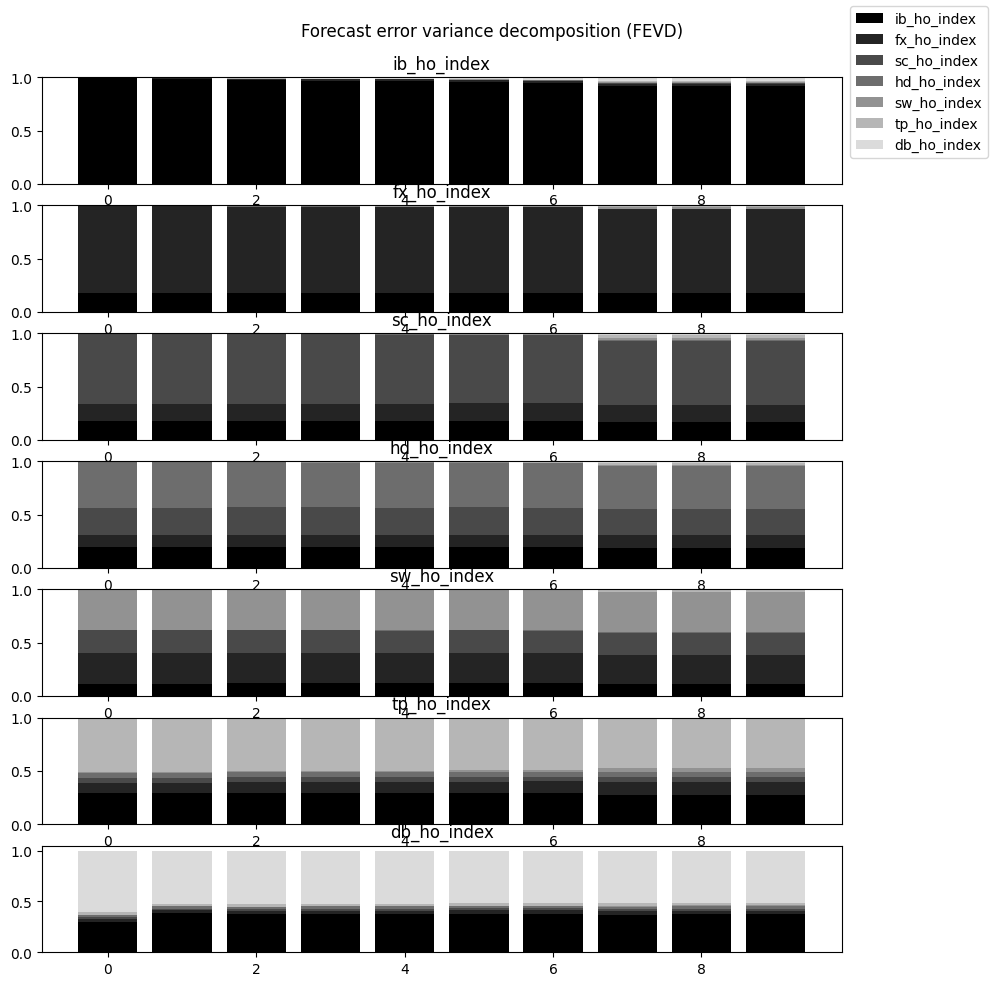

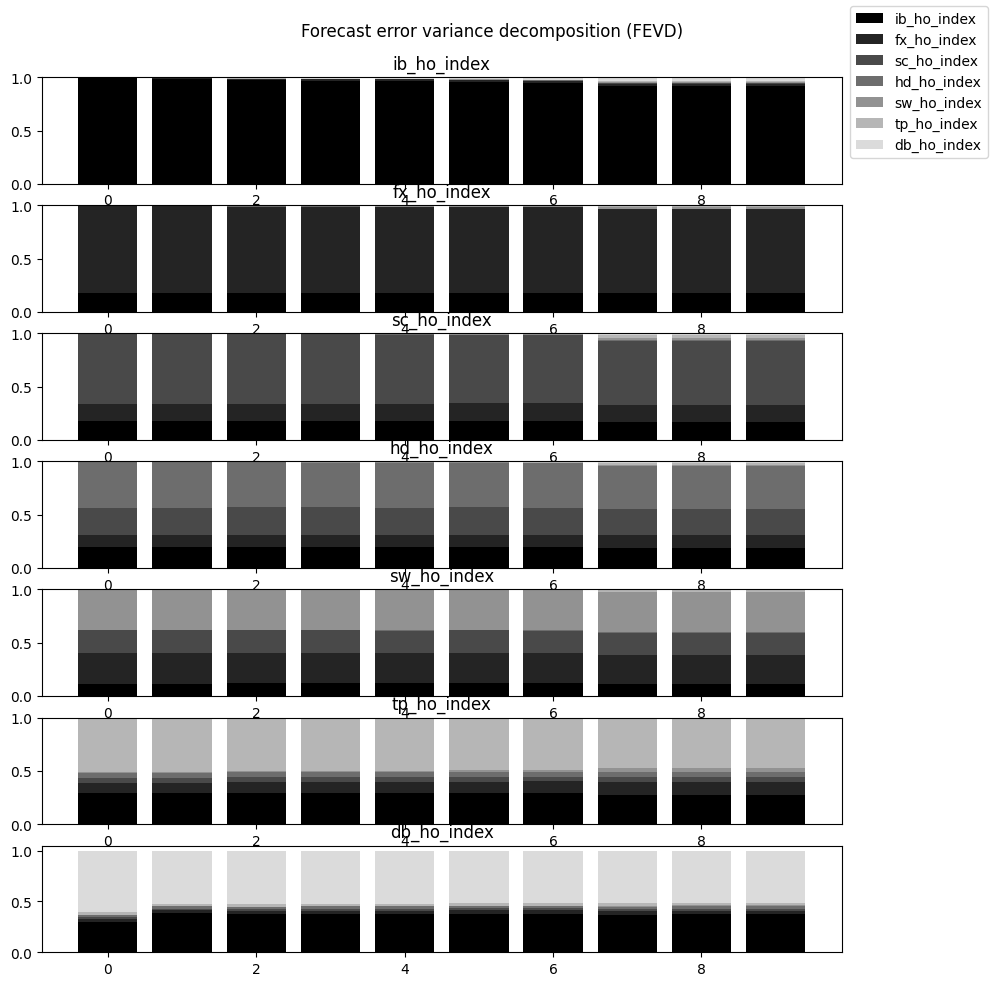

In [40]:
fevd_ho = hourly_VAR.fevd(10)
fevd_ho.summary()
fevd_ho.plot()

### For minutely model

FEVD for sw_mi_index
      sw_mi_index  tp_mi_index  sc_mi_index  ib_mi_index  hd_mi_index  fx_mi_index  db_mi_index
0        1.000000     0.000000     0.000000     0.000000     0.000000     0.000000     0.000000
1        0.987366     0.007082     0.004525     0.000222     0.000090     0.000324     0.000391
2        0.981984     0.007053     0.004550     0.000451     0.002324     0.000798     0.002841
3        0.968340     0.012340     0.006000     0.001447     0.008247     0.000823     0.002802
4        0.958210     0.016795     0.005914     0.001563     0.008676     0.000849     0.007992
5        0.953956     0.018972     0.006046     0.001589     0.008699     0.000964     0.009774
6        0.953505     0.019025     0.006096     0.001587     0.009040     0.000978     0.009768
7        0.952499     0.019421     0.006265     0.001620     0.009074     0.000980     0.010140
8        0.952281     0.019414     0.006263     0.001619     0.009104     0.000982     0.010338
9        0.952080  

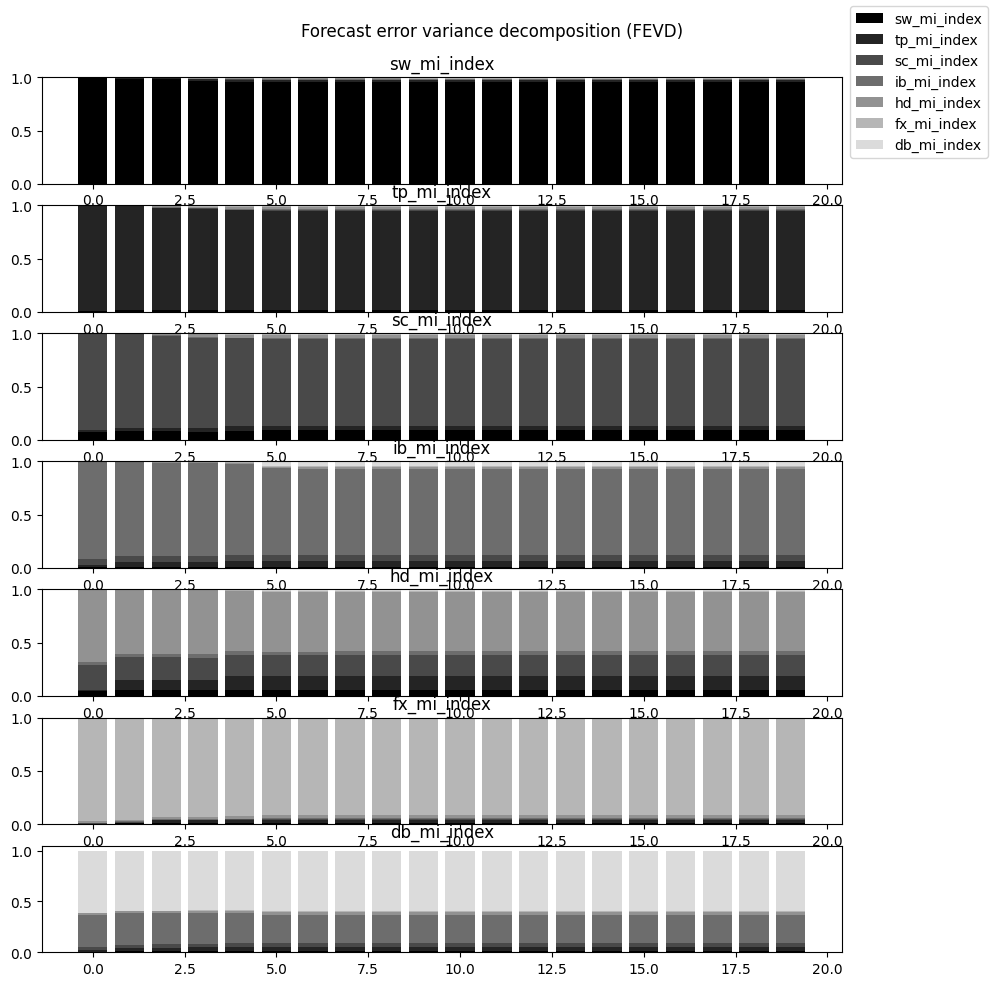

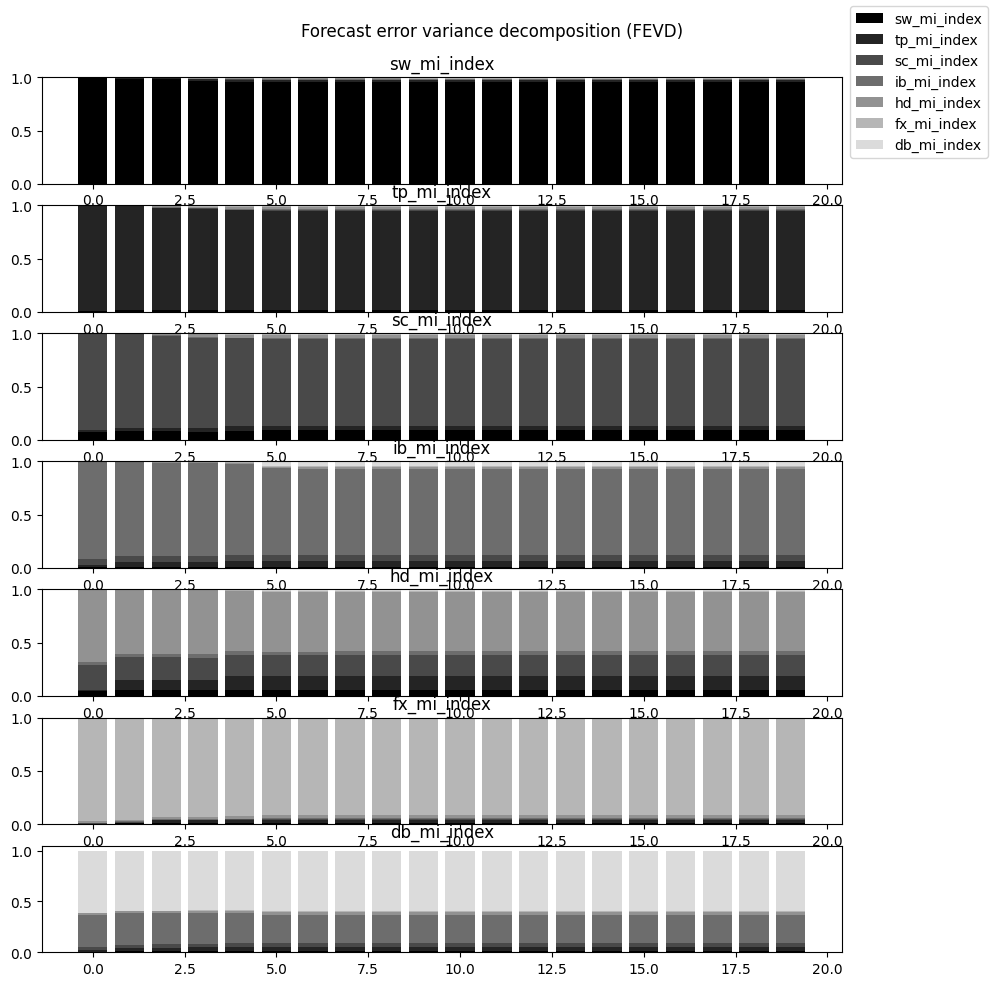

In [42]:
fevd_mi = minutely_VAR.fevd(20)
fevd_mi.summary()
fevd_mi.plot()